
# GammaNet Attention Analysis & Modulation Notebook

Dit notebook analyseert:

1. Welke feature-populaties/channels reageren op contouren
2. Hoe activaties veranderen over timesteps
3. Welke channels contour-selectief zijn
4. Welke channels robuust blijven bij hoge jitter
5. Wat er gebeurt wanneer attention-modulatie wordt toegevoegd

Het notebook ondersteunt drie attention-mechanismen:

- Optie A: Gain modulation
- Optie B: Inhibitory suppression
- Optie C: Top-down attention bias

Doel:
een biologisch interpreteerbare analyse met daarin:
- contourintegratie
- recurrente verwerking
- aandacht
- psychofysische jitter thresholds
- feature-populaties in GammaNet


In [1]:

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F

from sklearn.decomposition import PCA
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler
from gammanet.models import VGG16GammaNetV2


plt.rcParams['figure.figsize'] = (10,6)
device = 'cuda' if torch.cuda.is_available() else 'cpu'

print(device)


cpu


In [2]:
#Paths
input_dir = "/home/yentl/pytorch_gammanet/Images"
output_dir = "/home/yentl/pytorch_gammanet/Output_Images"
checkpoint_path = "/home/yentl/pytorch_gammanet/checkpoint_epoch_40.pt"

os.makedirs(output_dir, exist_ok=True)

In [3]:
#Inspect weight dimensions
checkpoint = torch.load(checkpoint_path, map_location="cpu", weights_only=False)

config = checkpoint['config']['model']

model = VGG16GammaNetV2(config)
model.load_state_dict(checkpoint['model_state_dict'], strict=False)

model.to(device)
model.eval()

print(f"Loaded model from epoch {checkpoint['epoch']}")
print(f"Validation F1: {checkpoint.get('best_metric', 'N/A')}")

/home/yentl/anaconda3/envs/pygestalt_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yentl/anaconda3/envs/pygestalt_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loaded model from epoch 40
Validation F1: 0.6260475346234085


In [4]:
#Overview
print(model)

VGG16GammaNetV2(
  (block1_conv): VGG16Block(
    (layers): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (block2_conv): VGG16Block(
    (layers): Sequential(
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
    )
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (block3_conv): VGG16Block(
    (layers): Sequential(
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     


# Configuratie

In [5]:

# ============================================================
# AUTOMATISCHE DATASET PARSING
# ============================================================

import re
from collections import defaultdict

IMAGE_ROOT = '/home/yentl/pytorch_gammanet/Images'

pattern = re.compile(
    r'(straight|C)_(high|low)_(TR|TL|BR|BL)_(\d)_J(\d{3})_(\d+)'
)

dataset_index = []

for fname in os.listdir(IMAGE_ROOT):

    match = pattern.match(fname)

    if match is None:
        continue

    contour_type = match.group(1)
    contrast = match.group(2)
    quadrant = match.group(3)
    contour_position = int(match.group(4))
    jitter = int(match.group(5))
    stimulus_id = int(match.group(6))

    dataset_index.append({
        'filename': fname,
        'path': os.path.join(IMAGE_ROOT, fname),
        'contour_type': contour_type,
        'contrast': contrast,
        'quadrant': quadrant,
        'position': contour_position,
        'jitter': jitter,
        'stimulus_id': stimulus_id,
    })

dataset_df = pd.DataFrame(dataset_index)

print(dataset_df.head())
print()
print(f'Total images: {len(dataset_df)}')


                         filename  \
0  straight_low_BL_0_J059_006.png   
1         C_low_BL_0_J002_008.png   
2        C_high_BL_0_J023_003.png   
3  straight_low_BL_0_J015_015.png   
4         C_low_BL_0_J030_076.png   

                                                path contour_type contrast  \
0  /home/yentl/pytorch_gammanet/Images/straight_l...     straight      low   
1  /home/yentl/pytorch_gammanet/Images/C_low_BL_0...            C      low   
2  /home/yentl/pytorch_gammanet/Images/C_high_BL_...            C     high   
3  /home/yentl/pytorch_gammanet/Images/straight_l...     straight      low   
4  /home/yentl/pytorch_gammanet/Images/C_low_BL_0...            C      low   

  quadrant  position  jitter  stimulus_id  
0       BL         0      59            6  
1       BL         0       2            8  
2       BL         0      23            3  
3       BL         0      15           15  
4       BL         0      30           76  

Total images: 242



# Attention wrapper

Deze klasse voegt attention-modulatie toe aan het bestaande model.


In [6]:

class AttentionModulator:

    def __init__(
        self,
        model,
        attention_type='gain',
        target_layer='h2_exc',
        target_channels=None,
        gain=1.2,
        inhibition_factor=0.8,
        td_bias_strength=0.2,
    ):

        self.model = model
        self.attention_type = attention_type
        self.target_layer = target_layer
        self.target_channels = target_channels or []
        self.gain = gain
        self.inhibition_factor = inhibition_factor
        self.td_bias_strength = td_bias_strength

    def apply(self):

        layer_tensor = getattr(self.model, self.target_layer)

        if layer_tensor is None:
            return

        # OPTION A
        if self.attention_type == 'gain':

            layer_tensor[:, self.target_channels] *= self.gain

        # OPTION B
        elif self.attention_type == 'inhibition':

            inh_name = self.target_layer.replace('exc', 'inh')

            if hasattr(self.model, inh_name):

                inh_tensor = getattr(self.model, inh_name)

                if inh_tensor is not None:
                    inh_tensor[:, self.target_channels] *= self.inhibition_factor

        # OPTION C
        elif self.attention_type == 'topdown_bias':

            bias = torch.zeros_like(layer_tensor)
            bias[:, self.target_channels] += self.td_bias_strength

            layer_tensor += bias



# Hooks voor activatie-analyse


In [7]:

class ActivationRecorder:

    def __init__(self, model):

        self.model = model
        self.activations = defaultdict(list)
        self.handles = []

    def register(self):

        target_layers = [
            'h0_exc',
            'h1_exc',
            'h2_exc',
            'h3_exc',
            'h4_exc',
            'td_h0_exc',
            'td_h1_exc',
            'td_h2_exc',
            'td_h3_exc',
        ]

        for layer_name in target_layers:

            def hook_factory(name):

                def hook(module, inp, out):

                    tensor = getattr(self.model, name)

                    if tensor is not None:
                        self.activations[name].append(
                            tensor.detach().cpu()
                        )

                return hook

            handle = self.model.register_forward_hook(
                hook_factory(layer_name)
            )

            self.handles.append(handle)

    def clear(self):
        self.activations = defaultdict(list)

    def remove(self):
        for h in self.handles:
            h.remove()



# Hulpfuncties


In [8]:

def global_channel_response(tensor):

    # [B,C,H,W] -> [C]
    return tensor.mean(dim=(0,2,3)).numpy()


def compute_selectivity_index(resp_a, resp_b):

    return (resp_a - resp_b) / (resp_a + resp_b + 1e-8)


def compute_temporal_persistence(timeseries):

    ts = np.array(timeseries)

    diffs = np.abs(np.diff(ts))

    return 1 / (diffs.mean() + 1e-8)



# Dataset loader

In [9]:

from PIL import Image
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((320,320)),
    transforms.ToTensor()
])

def load_images(folder):

    images = []

    for fname in os.listdir(folder):

        path = os.path.join(folder, fname)

        try:
            img = Image.open(path).convert('RGB')
            img = transform(img)
            images.append(img)

        except:
            pass

    return images



# Contour respons analyse


In [10]:

def analyze_condition(
    model,
    contour_type='straight',
    contrast='high',
    jitter_level=0,
):

    subset = dataset_df[
        (dataset_df['contour_type'] == contour_type) &
        (dataset_df['contrast'] == contrast) &
        (dataset_df['jitter'] == jitter_level)
    ]

    results = []

    for _, row in tqdm(subset.iterrows(), total=len(subset)):

        model.reset_hidden_states()

        img = Image.open(row['path']).convert('RGB')
        img = transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(img)

        sample_result = {
            'filename': row['filename'],
            'quadrant': row['quadrant'],
            'position': row['position'],
            'jitter': row['jitter'],
            'contrast': row['contrast'],
            'contour_type': row['contour_type'],
            'output_mean': output.mean().item(),
        }

        for layer_name in [
            'h0_exc',
            'h1_exc',
            'h2_exc',
            'h3_exc',
            'h4_exc',
        ]:

            tensor = getattr(model, layer_name)

            if tensor is not None:

                sample_result[layer_name] = global_channel_response(
                    tensor.detach().cpu()
                )

        results.append(sample_result)

    return results



# Volledige analyse uitvoeren


In [11]:
all_results = {}

contour_types = dataset_df['contour_type'].unique()
jitters = sorted(dataset_df['jitter'].unique())
contrasts = dataset_df['contrast'].unique()

for contour_type in contour_types:

    all_results[contour_type] = {}

    for contrast in contrasts:

        all_results[contour_type][contrast] = {}

        for jitter in jitters:

            print(f'Analyzing {contour_type} | {contrast} | jitter {jitter}')

            results = analyze_condition(
                model=model,
                contour_type=contour_type,
                contrast=contrast,
                jitter_level=jitter,
            )

            all_results[contour_type][contrast][jitter] = results

Analyzing straight | low | jitter 0


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:09<00:00,  9.62s/it]


Analyzing straight | low | jitter 1


100%|██████████| 1/1 [00:06<00:00,  6.66s/it]


Analyzing straight | low | jitter 2


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


Analyzing straight | low | jitter 3


100%|██████████| 1/1 [00:05<00:00,  5.96s/it]


Analyzing straight | low | jitter 4


100%|██████████| 1/1 [00:05<00:00,  5.63s/it]


Analyzing straight | low | jitter 5


100%|██████████| 1/1 [00:05<00:00,  5.91s/it]


Analyzing straight | low | jitter 6


100%|██████████| 1/1 [00:05<00:00,  5.88s/it]


Analyzing straight | low | jitter 7


100%|██████████| 1/1 [00:06<00:00,  6.10s/it]


Analyzing straight | low | jitter 8


100%|██████████| 1/1 [00:06<00:00,  6.38s/it]


Analyzing straight | low | jitter 9


100%|██████████| 1/1 [00:05<00:00,  5.51s/it]


Analyzing straight | low | jitter 10


100%|██████████| 1/1 [00:05<00:00,  5.92s/it]


Analyzing straight | low | jitter 11


100%|██████████| 1/1 [00:06<00:00,  6.19s/it]


Analyzing straight | low | jitter 12


100%|██████████| 1/1 [00:06<00:00,  6.07s/it]


Analyzing straight | low | jitter 13


100%|██████████| 1/1 [00:05<00:00,  5.68s/it]


Analyzing straight | low | jitter 14


100%|██████████| 1/1 [00:05<00:00,  5.77s/it]


Analyzing straight | low | jitter 15


100%|██████████| 1/1 [00:05<00:00,  5.87s/it]


Analyzing straight | low | jitter 16


100%|██████████| 1/1 [00:05<00:00,  5.60s/it]


Analyzing straight | low | jitter 17


100%|██████████| 1/1 [00:05<00:00,  5.48s/it]


Analyzing straight | low | jitter 18


100%|██████████| 1/1 [00:05<00:00,  5.98s/it]


Analyzing straight | low | jitter 19


100%|██████████| 1/1 [00:06<00:00,  6.15s/it]


Analyzing straight | low | jitter 20


100%|██████████| 1/1 [00:06<00:00,  6.24s/it]


Analyzing straight | low | jitter 21


100%|██████████| 1/1 [00:06<00:00,  6.13s/it]


Analyzing straight | low | jitter 22


100%|██████████| 1/1 [00:06<00:00,  6.27s/it]


Analyzing straight | low | jitter 23


100%|██████████| 1/1 [00:05<00:00,  5.93s/it]


Analyzing straight | low | jitter 24


100%|██████████| 1/1 [00:06<00:00,  6.22s/it]


Analyzing straight | low | jitter 25


100%|██████████| 1/1 [00:06<00:00,  6.05s/it]


Analyzing straight | low | jitter 26


100%|██████████| 1/1 [00:06<00:00,  6.06s/it]


Analyzing straight | low | jitter 27


100%|██████████| 1/1 [00:06<00:00,  6.35s/it]


Analyzing straight | low | jitter 28


100%|██████████| 1/1 [00:07<00:00,  7.86s/it]


Analyzing straight | low | jitter 29


100%|██████████| 1/1 [00:06<00:00,  6.59s/it]


Analyzing straight | low | jitter 30


100%|██████████| 1/1 [00:06<00:00,  6.22s/it]


Analyzing straight | low | jitter 31


100%|██████████| 1/1 [00:06<00:00,  6.37s/it]


Analyzing straight | low | jitter 32


100%|██████████| 1/1 [00:06<00:00,  6.30s/it]


Analyzing straight | low | jitter 33


100%|██████████| 1/1 [00:06<00:00,  6.17s/it]


Analyzing straight | low | jitter 34


100%|██████████| 1/1 [00:05<00:00,  5.85s/it]


Analyzing straight | low | jitter 35


100%|██████████| 1/1 [00:06<00:00,  6.05s/it]


Analyzing straight | low | jitter 36


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


Analyzing straight | low | jitter 37


100%|██████████| 1/1 [00:05<00:00,  5.96s/it]


Analyzing straight | low | jitter 38


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


Analyzing straight | low | jitter 39


100%|██████████| 1/1 [00:05<00:00,  5.87s/it]


Analyzing straight | low | jitter 40


100%|██████████| 1/1 [00:05<00:00,  5.69s/it]


Analyzing straight | low | jitter 41


100%|██████████| 1/1 [00:06<00:00,  6.15s/it]


Analyzing straight | low | jitter 42


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


Analyzing straight | low | jitter 43


100%|██████████| 1/1 [00:05<00:00,  5.33s/it]


Analyzing straight | low | jitter 44


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


Analyzing straight | low | jitter 45


100%|██████████| 1/1 [00:06<00:00,  6.10s/it]


Analyzing straight | low | jitter 46


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]


Analyzing straight | low | jitter 47


100%|██████████| 1/1 [00:05<00:00,  5.71s/it]


Analyzing straight | low | jitter 48


100%|██████████| 1/1 [00:06<00:00,  6.02s/it]


Analyzing straight | low | jitter 49


100%|██████████| 1/1 [00:06<00:00,  6.03s/it]


Analyzing straight | low | jitter 50


100%|██████████| 1/1 [00:06<00:00,  6.25s/it]


Analyzing straight | low | jitter 51


100%|██████████| 1/1 [00:05<00:00,  5.60s/it]


Analyzing straight | low | jitter 52


100%|██████████| 1/1 [00:06<00:00,  6.13s/it]


Analyzing straight | low | jitter 53


100%|██████████| 1/1 [00:06<00:00,  6.19s/it]


Analyzing straight | low | jitter 54


100%|██████████| 1/1 [00:06<00:00,  6.62s/it]


Analyzing straight | low | jitter 55


100%|██████████| 1/1 [00:05<00:00,  5.96s/it]


Analyzing straight | low | jitter 56


100%|██████████| 1/1 [00:06<00:00,  6.34s/it]


Analyzing straight | low | jitter 57


100%|██████████| 1/1 [00:05<00:00,  5.86s/it]


Analyzing straight | low | jitter 58


100%|██████████| 1/1 [00:05<00:00,  5.89s/it]


Analyzing straight | low | jitter 59


100%|██████████| 1/1 [00:06<00:00,  6.25s/it]


Analyzing straight | low | jitter 60


100%|██████████| 1/1 [00:06<00:00,  6.56s/it]


Analyzing straight | high | jitter 0


100%|██████████| 1/1 [00:06<00:00,  6.58s/it]


Analyzing straight | high | jitter 1


100%|██████████| 1/1 [00:05<00:00,  5.70s/it]


Analyzing straight | high | jitter 2


100%|██████████| 1/1 [00:06<00:00,  6.21s/it]


Analyzing straight | high | jitter 3


100%|██████████| 1/1 [00:06<00:00,  6.53s/it]


Analyzing straight | high | jitter 4


100%|██████████| 1/1 [00:06<00:00,  6.23s/it]


Analyzing straight | high | jitter 5


100%|██████████| 1/1 [00:06<00:00,  6.50s/it]


Analyzing straight | high | jitter 6


100%|██████████| 1/1 [00:06<00:00,  6.17s/it]


Analyzing straight | high | jitter 7


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


Analyzing straight | high | jitter 8


100%|██████████| 1/1 [00:06<00:00,  6.02s/it]


Analyzing straight | high | jitter 9


100%|██████████| 1/1 [00:06<00:00,  6.10s/it]


Analyzing straight | high | jitter 10


100%|██████████| 1/1 [00:05<00:00,  5.99s/it]


Analyzing straight | high | jitter 11


100%|██████████| 1/1 [00:06<00:00,  6.27s/it]


Analyzing straight | high | jitter 12


100%|██████████| 1/1 [00:06<00:00,  6.95s/it]


Analyzing straight | high | jitter 13


100%|██████████| 1/1 [00:05<00:00,  5.63s/it]


Analyzing straight | high | jitter 14


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


Analyzing straight | high | jitter 15


100%|██████████| 1/1 [00:06<00:00,  6.35s/it]


Analyzing straight | high | jitter 16


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


Analyzing straight | high | jitter 17


100%|██████████| 1/1 [00:06<00:00,  6.10s/it]


Analyzing straight | high | jitter 18


100%|██████████| 1/1 [00:06<00:00,  6.01s/it]


Analyzing straight | high | jitter 19


100%|██████████| 1/1 [00:06<00:00,  6.14s/it]


Analyzing straight | high | jitter 20


100%|██████████| 1/1 [00:06<00:00,  6.26s/it]


Analyzing straight | high | jitter 21


100%|██████████| 1/1 [00:06<00:00,  6.09s/it]


Analyzing straight | high | jitter 22


100%|██████████| 1/1 [00:06<00:00,  6.14s/it]


Analyzing straight | high | jitter 23


100%|██████████| 1/1 [00:06<00:00,  6.21s/it]


Analyzing straight | high | jitter 24


100%|██████████| 1/1 [00:06<00:00,  6.90s/it]


Analyzing straight | high | jitter 25


100%|██████████| 1/1 [00:06<00:00,  6.43s/it]


Analyzing straight | high | jitter 26


100%|██████████| 1/1 [00:05<00:00,  5.60s/it]


Analyzing straight | high | jitter 27


100%|██████████| 1/1 [00:06<00:00,  6.30s/it]


Analyzing straight | high | jitter 28


100%|██████████| 1/1 [00:06<00:00,  6.58s/it]


Analyzing straight | high | jitter 29


100%|██████████| 1/1 [00:06<00:00,  6.54s/it]


Analyzing straight | high | jitter 30


100%|██████████| 1/1 [00:06<00:00,  6.60s/it]


Analyzing straight | high | jitter 31


100%|██████████| 1/1 [00:06<00:00,  6.43s/it]


Analyzing straight | high | jitter 32


100%|██████████| 1/1 [00:06<00:00,  6.98s/it]


Analyzing straight | high | jitter 33


100%|██████████| 1/1 [00:06<00:00,  6.18s/it]


Analyzing straight | high | jitter 34


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


Analyzing straight | high | jitter 35


100%|██████████| 1/1 [00:06<00:00,  6.03s/it]


Analyzing straight | high | jitter 36


100%|██████████| 1/1 [00:05<00:00,  5.41s/it]


Analyzing straight | high | jitter 37


100%|██████████| 1/1 [00:06<00:00,  6.03s/it]


Analyzing straight | high | jitter 38


100%|██████████| 1/1 [00:06<00:00,  6.24s/it]


Analyzing straight | high | jitter 39


100%|██████████| 1/1 [00:06<00:00,  6.32s/it]


Analyzing straight | high | jitter 40


100%|██████████| 1/1 [00:06<00:00,  6.25s/it]


Analyzing straight | high | jitter 41


100%|██████████| 1/1 [00:05<00:00,  5.42s/it]


Analyzing straight | high | jitter 42


100%|██████████| 1/1 [00:05<00:00,  5.79s/it]


Analyzing straight | high | jitter 43


100%|██████████| 1/1 [00:06<00:00,  6.36s/it]


Analyzing straight | high | jitter 44


100%|██████████| 1/1 [00:06<00:00,  6.22s/it]


Analyzing straight | high | jitter 45


100%|██████████| 1/1 [00:06<00:00,  6.42s/it]


Analyzing straight | high | jitter 46


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]


Analyzing straight | high | jitter 47


100%|██████████| 1/1 [00:05<00:00,  5.90s/it]


Analyzing straight | high | jitter 48


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]


Analyzing straight | high | jitter 49


100%|██████████| 1/1 [00:05<00:00,  5.89s/it]


Analyzing straight | high | jitter 50


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


Analyzing straight | high | jitter 51


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


Analyzing straight | high | jitter 52


100%|██████████| 1/1 [00:05<00:00,  5.79s/it]


Analyzing straight | high | jitter 53


100%|██████████| 1/1 [00:05<00:00,  5.88s/it]


Analyzing straight | high | jitter 54


100%|██████████| 1/1 [00:06<00:00,  6.70s/it]


Analyzing straight | high | jitter 55


100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


Analyzing straight | high | jitter 56


100%|██████████| 1/1 [00:05<00:00,  5.70s/it]


Analyzing straight | high | jitter 57


100%|██████████| 1/1 [00:05<00:00,  5.87s/it]


Analyzing straight | high | jitter 58


100%|██████████| 1/1 [00:05<00:00,  5.76s/it]


Analyzing straight | high | jitter 59


100%|██████████| 1/1 [00:06<00:00,  6.07s/it]


Analyzing straight | high | jitter 60


100%|██████████| 1/1 [00:05<00:00,  5.92s/it]


Analyzing C | low | jitter 0


100%|██████████| 1/1 [00:06<00:00,  6.06s/it]


Analyzing C | low | jitter 1


100%|██████████| 1/1 [00:05<00:00,  5.63s/it]


Analyzing C | low | jitter 2


100%|██████████| 1/1 [00:06<00:00,  6.17s/it]


Analyzing C | low | jitter 3


100%|██████████| 1/1 [00:06<00:00,  6.01s/it]


Analyzing C | low | jitter 4


100%|██████████| 1/1 [00:06<00:00,  6.10s/it]


Analyzing C | low | jitter 5


100%|██████████| 1/1 [00:06<00:00,  6.22s/it]


Analyzing C | low | jitter 6


100%|██████████| 1/1 [00:05<00:00,  5.85s/it]


Analyzing C | low | jitter 7


100%|██████████| 1/1 [00:06<00:00,  6.05s/it]


Analyzing C | low | jitter 8


100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


Analyzing C | low | jitter 9


100%|██████████| 1/1 [00:06<00:00,  6.26s/it]


Analyzing C | low | jitter 10


100%|██████████| 1/1 [00:05<00:00,  5.85s/it]


Analyzing C | low | jitter 11


100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


Analyzing C | low | jitter 12


100%|██████████| 1/1 [00:05<00:00,  5.76s/it]


Analyzing C | low | jitter 13


100%|██████████| 1/1 [00:06<00:00,  6.09s/it]


Analyzing C | low | jitter 14


100%|██████████| 1/1 [00:06<00:00,  6.23s/it]


Analyzing C | low | jitter 15


100%|██████████| 1/1 [00:05<00:00,  5.90s/it]


Analyzing C | low | jitter 16


100%|██████████| 1/1 [00:06<00:00,  6.10s/it]


Analyzing C | low | jitter 17


100%|██████████| 1/1 [00:06<00:00,  6.09s/it]


Analyzing C | low | jitter 18


100%|██████████| 1/1 [00:05<00:00,  5.96s/it]


Analyzing C | low | jitter 19


100%|██████████| 1/1 [00:06<00:00,  6.15s/it]


Analyzing C | low | jitter 20


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]


Analyzing C | low | jitter 21


100%|██████████| 1/1 [00:05<00:00,  5.95s/it]


Analyzing C | low | jitter 22


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


Analyzing C | low | jitter 23


100%|██████████| 1/1 [00:05<00:00,  5.63s/it]


Analyzing C | low | jitter 24


100%|██████████| 1/1 [00:05<00:00,  5.54s/it]


Analyzing C | low | jitter 25


100%|██████████| 1/1 [00:05<00:00,  5.99s/it]


Analyzing C | low | jitter 26


100%|██████████| 1/1 [00:06<00:00,  6.09s/it]


Analyzing C | low | jitter 27


100%|██████████| 1/1 [00:05<00:00,  5.85s/it]


Analyzing C | low | jitter 28


100%|██████████| 1/1 [00:05<00:00,  5.92s/it]


Analyzing C | low | jitter 29


100%|██████████| 1/1 [00:05<00:00,  5.92s/it]


Analyzing C | low | jitter 30


100%|██████████| 1/1 [00:06<00:00,  6.03s/it]


Analyzing C | low | jitter 31


100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


Analyzing C | low | jitter 32


100%|██████████| 1/1 [00:06<00:00,  6.01s/it]


Analyzing C | low | jitter 33


100%|██████████| 1/1 [00:05<00:00,  5.95s/it]


Analyzing C | low | jitter 34


100%|██████████| 1/1 [00:05<00:00,  5.75s/it]


Analyzing C | low | jitter 35


100%|██████████| 1/1 [00:06<00:00,  6.15s/it]


Analyzing C | low | jitter 36


100%|██████████| 1/1 [00:06<00:00,  6.31s/it]


Analyzing C | low | jitter 37


100%|██████████| 1/1 [00:05<00:00,  5.85s/it]


Analyzing C | low | jitter 38


100%|██████████| 1/1 [00:05<00:00,  5.86s/it]


Analyzing C | low | jitter 39


100%|██████████| 1/1 [00:05<00:00,  5.13s/it]


Analyzing C | low | jitter 40


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]


Analyzing C | low | jitter 41


100%|██████████| 1/1 [00:05<00:00,  5.65s/it]


Analyzing C | low | jitter 42


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


Analyzing C | low | jitter 43


100%|██████████| 1/1 [00:05<00:00,  5.56s/it]


Analyzing C | low | jitter 44


100%|██████████| 1/1 [00:05<00:00,  5.75s/it]


Analyzing C | low | jitter 45


100%|██████████| 1/1 [00:05<00:00,  5.29s/it]


Analyzing C | low | jitter 46


100%|██████████| 1/1 [00:05<00:00,  5.61s/it]


Analyzing C | low | jitter 47


100%|██████████| 1/1 [00:05<00:00,  5.48s/it]


Analyzing C | low | jitter 48


100%|██████████| 1/1 [00:05<00:00,  5.63s/it]


Analyzing C | low | jitter 49


100%|██████████| 1/1 [00:05<00:00,  5.74s/it]


Analyzing C | low | jitter 50


100%|██████████| 1/1 [00:05<00:00,  5.52s/it]


Analyzing C | low | jitter 51


100%|██████████| 1/1 [00:05<00:00,  5.64s/it]


Analyzing C | low | jitter 52


100%|██████████| 1/1 [00:05<00:00,  5.69s/it]


Analyzing C | low | jitter 53


100%|██████████| 1/1 [00:05<00:00,  5.22s/it]


Analyzing C | low | jitter 54


100%|██████████| 1/1 [00:05<00:00,  5.72s/it]


Analyzing C | low | jitter 55


100%|██████████| 1/1 [00:05<00:00,  5.52s/it]


Analyzing C | low | jitter 56


100%|██████████| 1/1 [00:05<00:00,  5.60s/it]


Analyzing C | low | jitter 57


100%|██████████| 1/1 [00:05<00:00,  5.70s/it]


Analyzing C | low | jitter 58


100%|██████████| 1/1 [00:05<00:00,  5.71s/it]


Analyzing C | low | jitter 59


0it [00:00, ?it/s]


Analyzing C | low | jitter 60


100%|██████████| 1/1 [00:05<00:00,  5.49s/it]


Analyzing C | high | jitter 0


100%|██████████| 1/1 [00:05<00:00,  5.51s/it]


Analyzing C | high | jitter 1


100%|██████████| 1/1 [00:05<00:00,  5.68s/it]


Analyzing C | high | jitter 2


100%|██████████| 1/1 [00:05<00:00,  5.93s/it]


Analyzing C | high | jitter 3


100%|██████████| 1/1 [00:05<00:00,  5.44s/it]


Analyzing C | high | jitter 4


100%|██████████| 1/1 [00:05<00:00,  5.69s/it]


Analyzing C | high | jitter 5


100%|██████████| 1/1 [00:05<00:00,  5.34s/it]


Analyzing C | high | jitter 6


100%|██████████| 1/1 [00:05<00:00,  5.68s/it]


Analyzing C | high | jitter 7


100%|██████████| 1/1 [00:05<00:00,  5.47s/it]


Analyzing C | high | jitter 8


100%|██████████| 1/1 [00:05<00:00,  5.78s/it]


Analyzing C | high | jitter 9


100%|██████████| 1/1 [00:05<00:00,  5.42s/it]


Analyzing C | high | jitter 10


100%|██████████| 1/1 [00:05<00:00,  5.65s/it]


Analyzing C | high | jitter 11


100%|██████████| 1/1 [00:05<00:00,  5.77s/it]


Analyzing C | high | jitter 12


100%|██████████| 1/1 [00:05<00:00,  5.59s/it]


Analyzing C | high | jitter 13


100%|██████████| 1/1 [00:05<00:00,  5.26s/it]


Analyzing C | high | jitter 14


100%|██████████| 1/1 [00:05<00:00,  5.74s/it]


Analyzing C | high | jitter 15


100%|██████████| 1/1 [00:05<00:00,  5.86s/it]


Analyzing C | high | jitter 16


100%|██████████| 1/1 [00:05<00:00,  5.98s/it]


Analyzing C | high | jitter 17


100%|██████████| 1/1 [00:05<00:00,  5.64s/it]


Analyzing C | high | jitter 18


100%|██████████| 1/1 [00:06<00:00,  6.09s/it]


Analyzing C | high | jitter 19


100%|██████████| 1/1 [00:05<00:00,  5.85s/it]


Analyzing C | high | jitter 20


100%|██████████| 1/1 [00:06<00:00,  6.08s/it]


Analyzing C | high | jitter 21


100%|██████████| 1/1 [00:05<00:00,  5.82s/it]


Analyzing C | high | jitter 22


100%|██████████| 1/1 [00:05<00:00,  5.66s/it]


Analyzing C | high | jitter 23


100%|██████████| 1/1 [00:05<00:00,  5.49s/it]


Analyzing C | high | jitter 24


100%|██████████| 1/1 [00:05<00:00,  5.80s/it]


Analyzing C | high | jitter 25


100%|██████████| 1/1 [00:06<00:00,  6.01s/it]


Analyzing C | high | jitter 26


100%|██████████| 1/1 [00:06<00:00,  6.01s/it]


Analyzing C | high | jitter 27


100%|██████████| 1/1 [00:05<00:00,  5.60s/it]


Analyzing C | high | jitter 28


100%|██████████| 1/1 [00:06<00:00,  6.02s/it]


Analyzing C | high | jitter 29


100%|██████████| 1/1 [00:05<00:00,  5.88s/it]


Analyzing C | high | jitter 30


100%|██████████| 1/1 [00:05<00:00,  5.70s/it]


Analyzing C | high | jitter 31


100%|██████████| 1/1 [00:05<00:00,  5.89s/it]


Analyzing C | high | jitter 32


100%|██████████| 1/1 [00:05<00:00,  5.81s/it]


Analyzing C | high | jitter 33


100%|██████████| 1/1 [00:05<00:00,  5.75s/it]


Analyzing C | high | jitter 34


100%|██████████| 1/1 [00:05<00:00,  5.61s/it]


Analyzing C | high | jitter 35


100%|██████████| 1/1 [00:06<00:00,  6.00s/it]


Analyzing C | high | jitter 36


100%|██████████| 1/1 [00:06<00:00,  6.30s/it]


Analyzing C | high | jitter 37


100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


Analyzing C | high | jitter 38


100%|██████████| 1/1 [00:05<00:00,  5.92s/it]


Analyzing C | high | jitter 39


100%|██████████| 1/1 [00:05<00:00,  5.79s/it]


Analyzing C | high | jitter 40


100%|██████████| 1/1 [00:05<00:00,  5.74s/it]


Analyzing C | high | jitter 41


100%|██████████| 1/1 [00:06<00:00,  6.07s/it]


Analyzing C | high | jitter 42


100%|██████████| 1/1 [00:05<00:00,  5.75s/it]


Analyzing C | high | jitter 43


100%|██████████| 1/1 [00:05<00:00,  5.67s/it]


Analyzing C | high | jitter 44


100%|██████████| 1/1 [00:05<00:00,  5.47s/it]


Analyzing C | high | jitter 45


100%|██████████| 1/1 [00:05<00:00,  5.77s/it]


Analyzing C | high | jitter 46


100%|██████████| 1/1 [00:06<00:00,  6.05s/it]


Analyzing C | high | jitter 47


100%|██████████| 1/1 [00:05<00:00,  5.84s/it]


Analyzing C | high | jitter 48


100%|██████████| 1/1 [00:05<00:00,  5.70s/it]


Analyzing C | high | jitter 49


100%|██████████| 1/1 [00:05<00:00,  5.87s/it]


Analyzing C | high | jitter 50


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]


Analyzing C | high | jitter 51


100%|██████████| 1/1 [00:05<00:00,  5.62s/it]


Analyzing C | high | jitter 52


100%|██████████| 1/1 [00:05<00:00,  5.62s/it]


Analyzing C | high | jitter 53


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]


Analyzing C | high | jitter 54


100%|██████████| 1/1 [00:05<00:00,  5.32s/it]


Analyzing C | high | jitter 55


100%|██████████| 1/1 [00:05<00:00,  5.67s/it]


Analyzing C | high | jitter 56


100%|██████████| 1/1 [00:05<00:00,  5.69s/it]


Analyzing C | high | jitter 57


100%|██████████| 1/1 [00:05<00:00,  5.91s/it]


Analyzing C | high | jitter 58


100%|██████████| 1/1 [00:06<00:00,  6.28s/it]


Analyzing C | high | jitter 59


0it [00:00, ?it/s]


Analyzing C | high | jitter 60


100%|██████████| 1/1 [00:06<00:00,  6.03s/it]



# Gemiddelde activaties berekenen


In [12]:
layer_summary = defaultdict(dict)

for contour_type in all_results:

    for contrast in all_results[contour_type]:

        for jitter in all_results[contour_type][contrast]:

            samples = all_results[contour_type][contrast][jitter]

            if len(samples) == 0:
                continue

            for layer in samples[0].keys():

                # skip metadata velden
                if layer in [
                    'filename',
                    'quadrant',
                    'position',
                    'jitter',
                    'contrast',
                    'contour_type',
                    'output_mean',
                ]:
                    continue

                data = np.stack([s[layer] for s in samples])

                mean_resp = data.mean(axis=0)

                layer_summary[
                    (contour_type, contrast, jitter)
                ][layer] = mean_resp


# Selectiviteit per channel

Bpalen welke channels specifiek reageren op C-contours of straight contours.


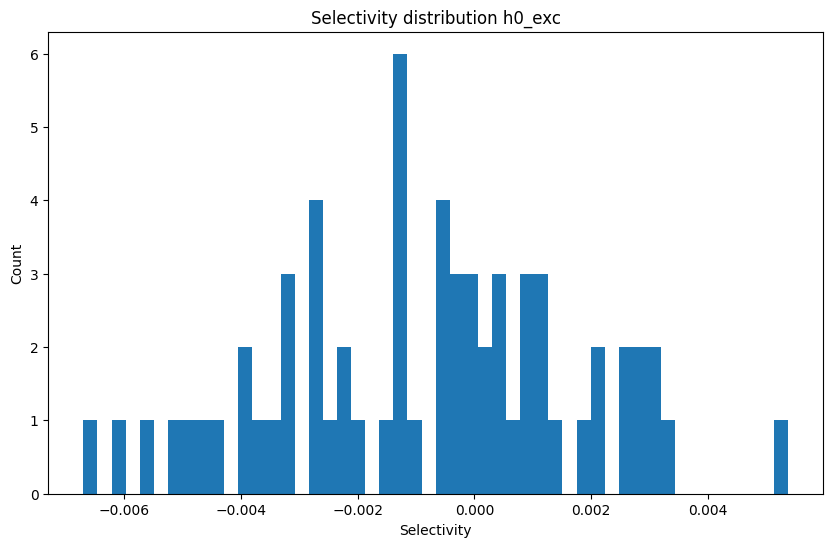

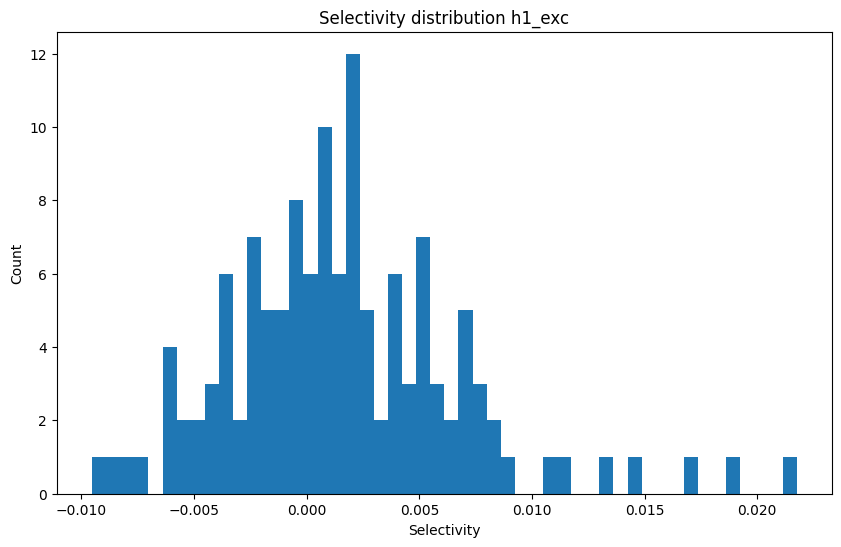

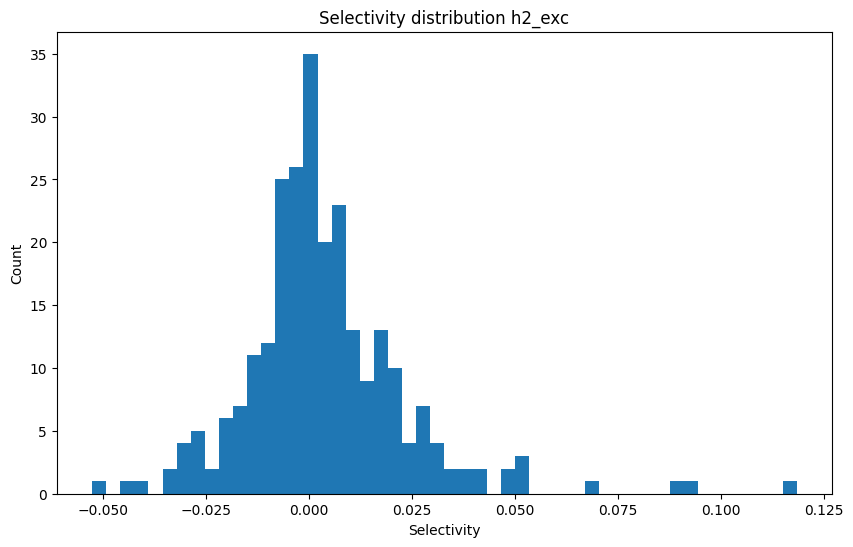

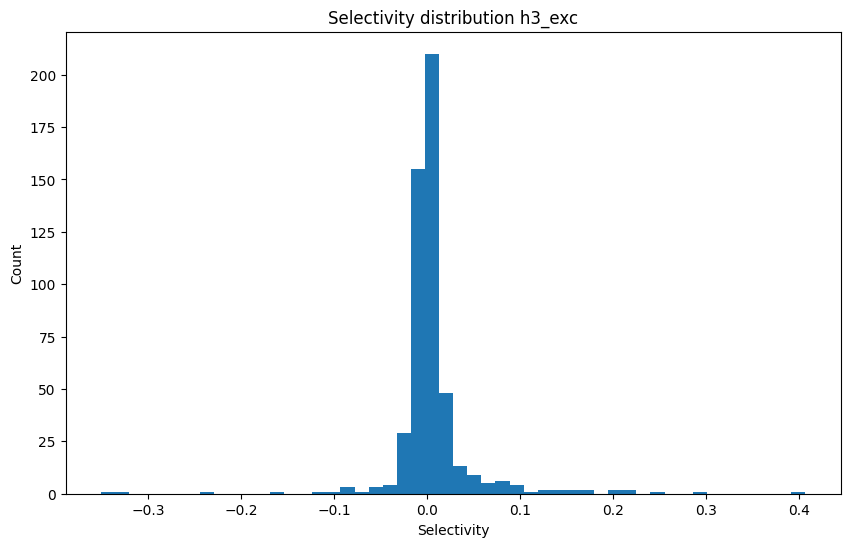

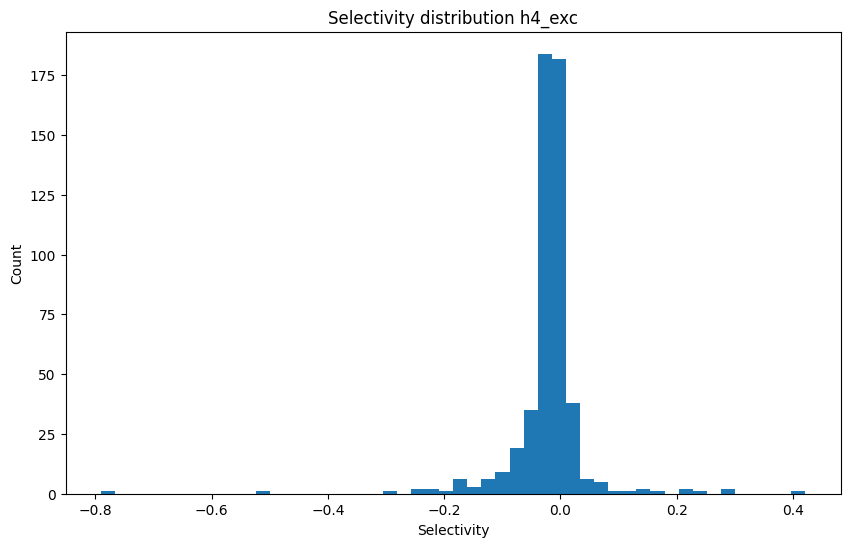

In [13]:
selectivity_results = {}

for layer in ['h0_exc','h1_exc','h2_exc','h3_exc','h4_exc']:

    try:

        # vergelijk C vs straight bij high contrast en jitter 0
        c_resp = layer_summary[('C', 'high', 0)][layer]

        s_resp = layer_summary[('straight', 'high', 0)][layer]

        sel = compute_selectivity_index(c_resp, s_resp)

        selectivity_results[layer] = sel

        plt.figure()

        plt.hist(sel, bins=50)

        plt.title(f'Selectivity distribution {layer}')

        plt.xlabel('Selectivity')

        plt.ylabel('Count')

        plt.show()

    except KeyError as e:

        print(f'Missing data for {layer}: {e}')

# TOP-SELECTIVE CHANNELS + SPATIAL MAPS + TEMPORAL ANALYSIS


h1_exc
C-selective channels SI > 0.08:
[]
Top C-selective channels:
[(113, 0.021748516708612442), (11, 0.0186610147356987), (119, 0.017137322574853897), (44, 0.014533679001033306), (124, 0.013607579283416271), (4, 0.01129479706287384), (86, 0.010642161592841148), (98, 0.008617173880338669), (61, 0.008210554718971252), (40, 0.00807230919599533)]

Straight-selective channels SI < -0.08:
[]
Top straight-selective channels:
[(68, -0.009522142820060253), (78, -0.00869210809469223), (53, -0.0077611044980585575), (18, -0.00718268845230341), (29, -0.006303073838353157), (84, -0.006290195509791374), (48, -0.0061579253524541855), (123, -0.0057868328876793385), (122, -0.005570153705775738), (24, -0.00527891656383872)]

h2_exc
C-selective channels SI > 0.08:
[ 93 108 216]
Top C-selective channels:
[(93, 0.11842025816440582), (108, 0.09192276000976562), (216, 0.08881645649671555), (112, 0.06752220541238785), (16, 0.05273270979523659), (13, 0.05213438719511032), (116, 0.05017402395606041), (161, 0.

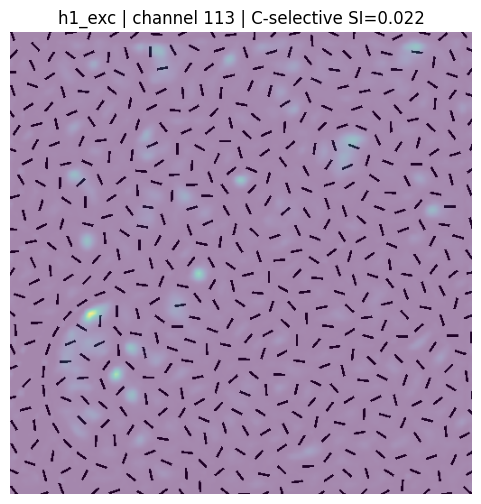

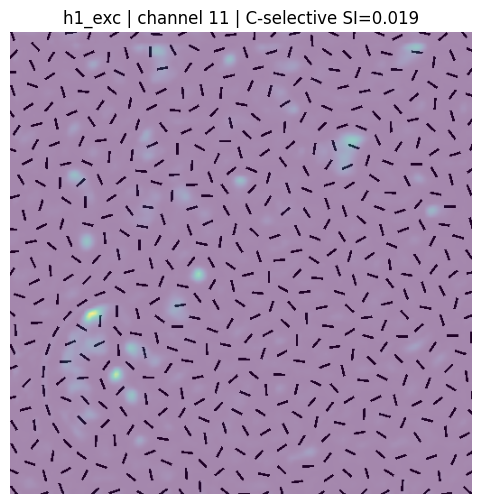

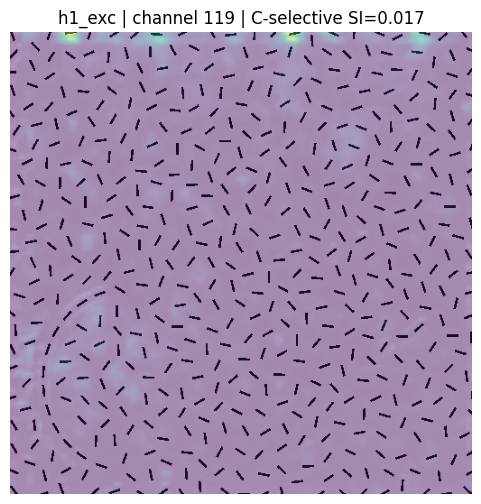

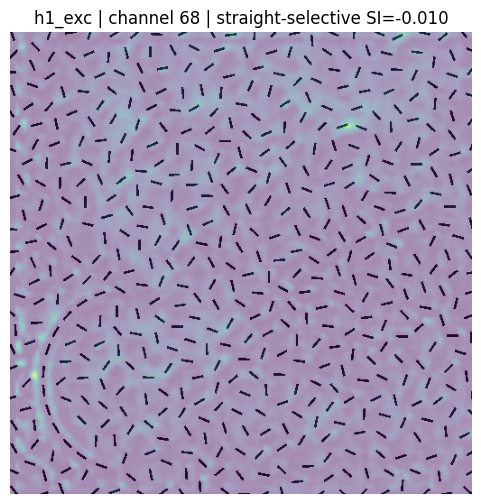

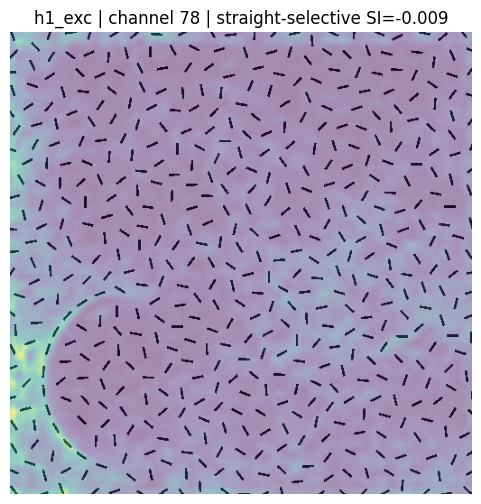

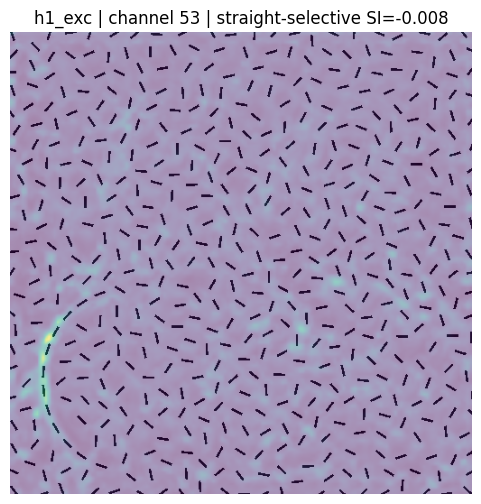


Spatial maps for h2_exc


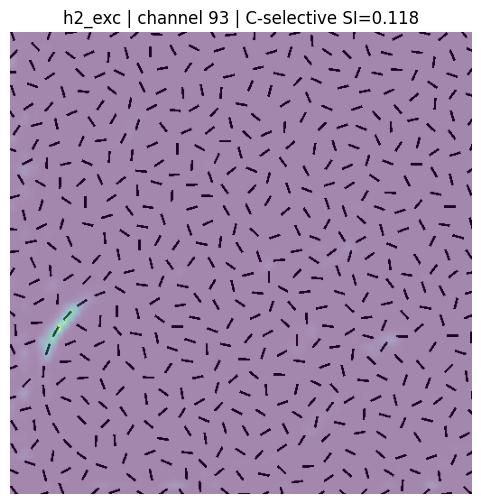

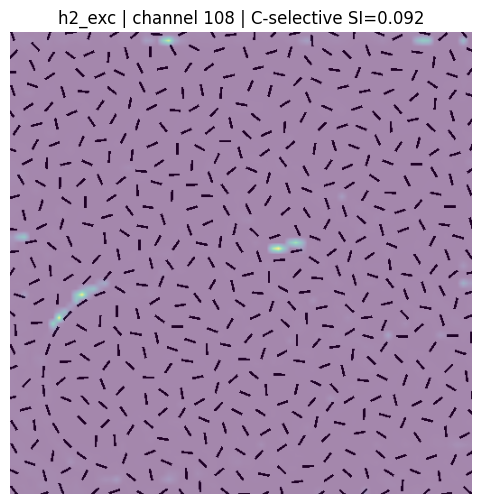

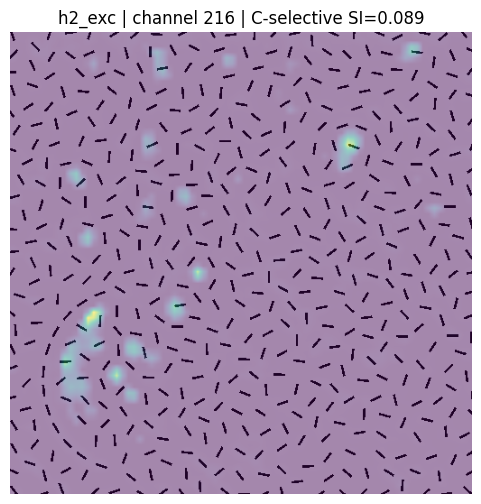

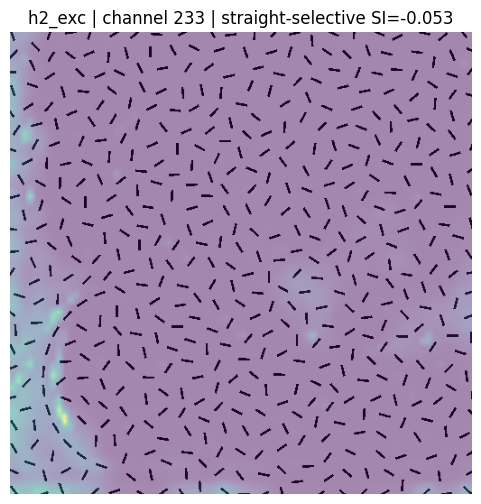

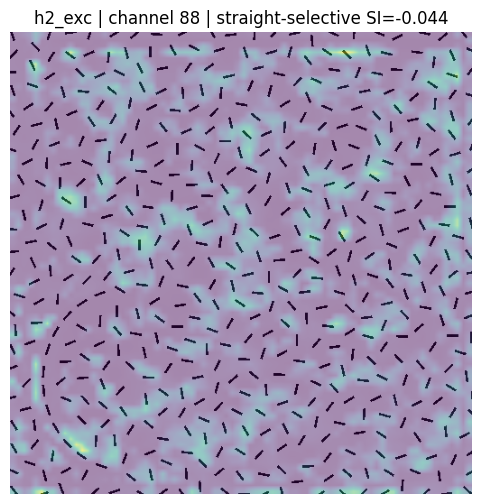

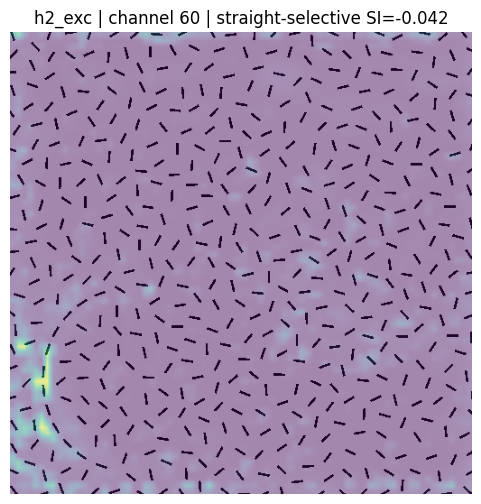


Spatial maps for h3_exc


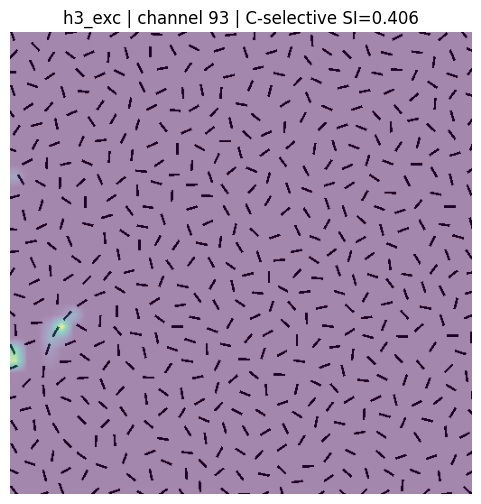

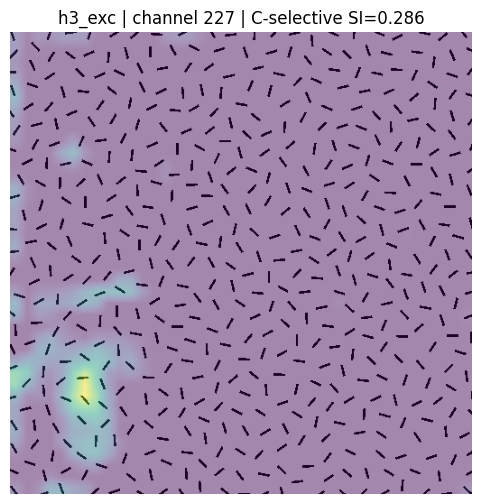

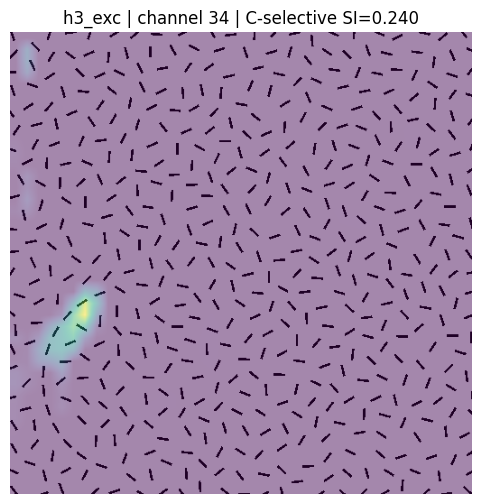

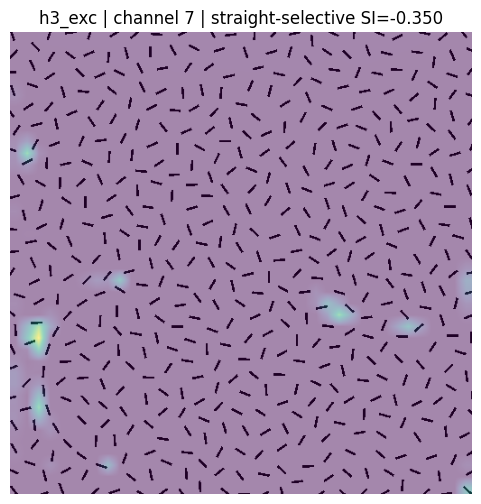

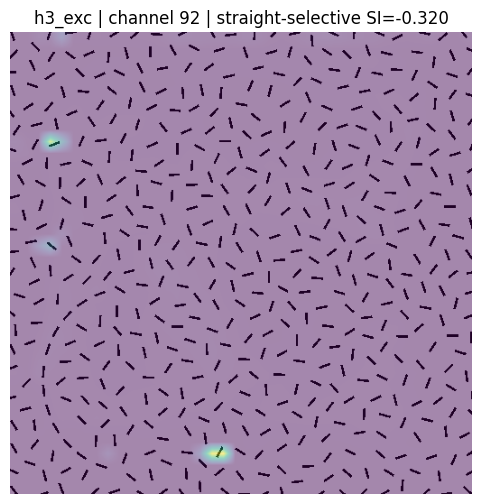

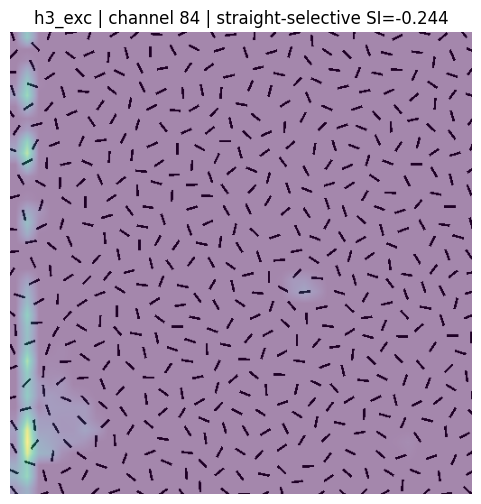


Spatial maps for h4_exc


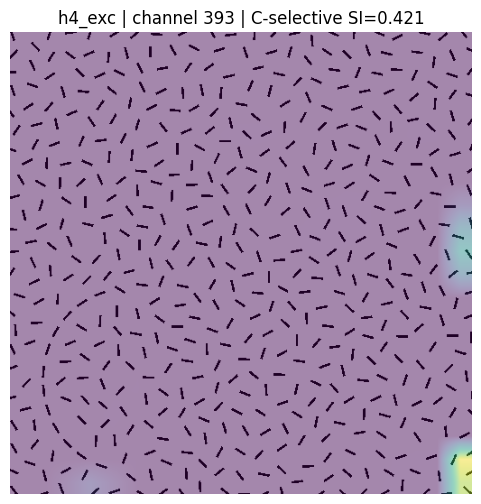

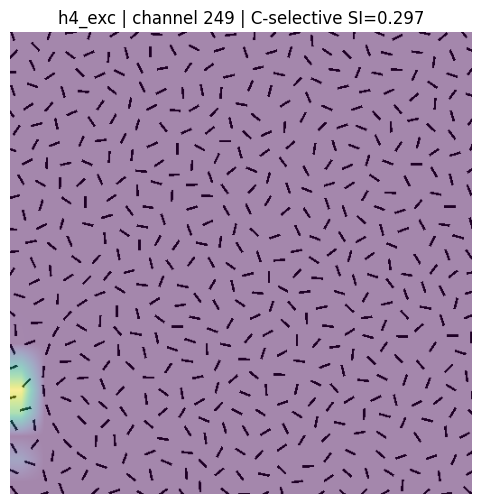

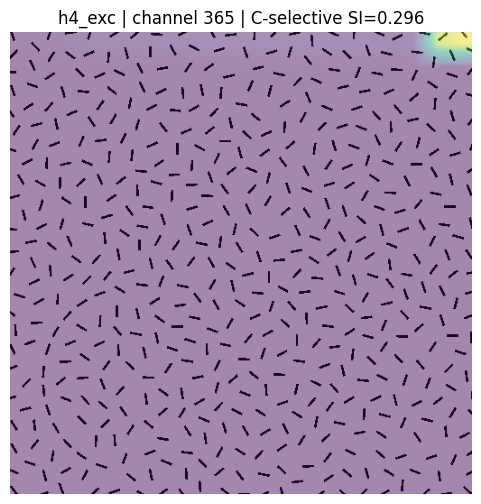

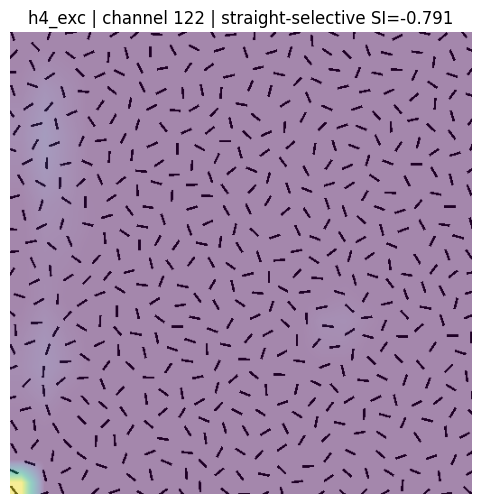

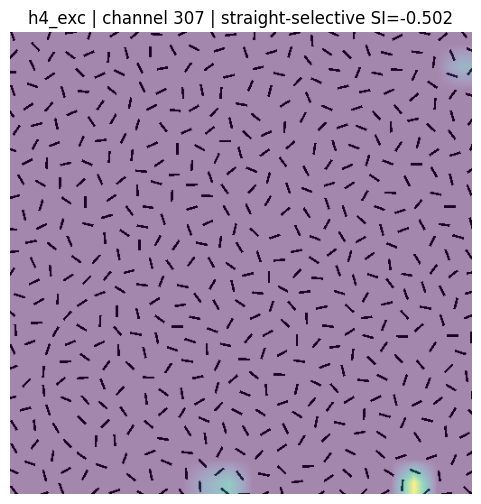

...

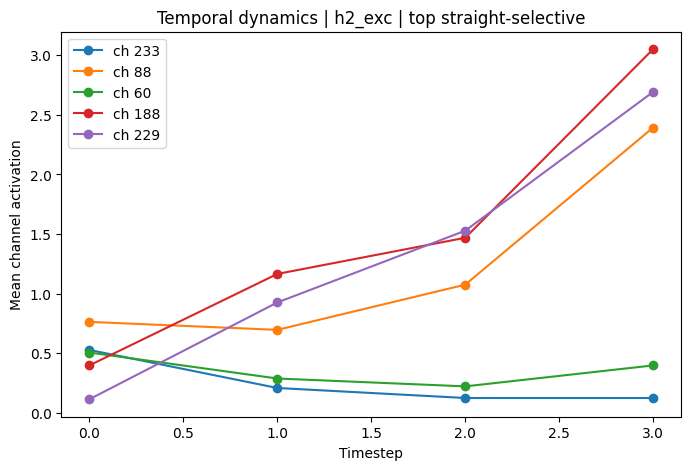

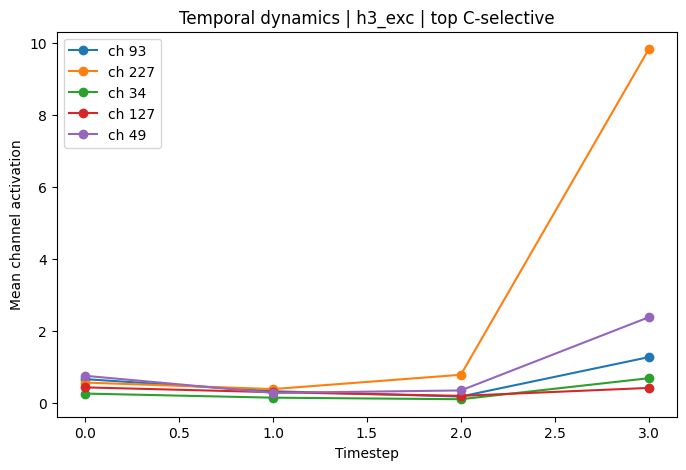

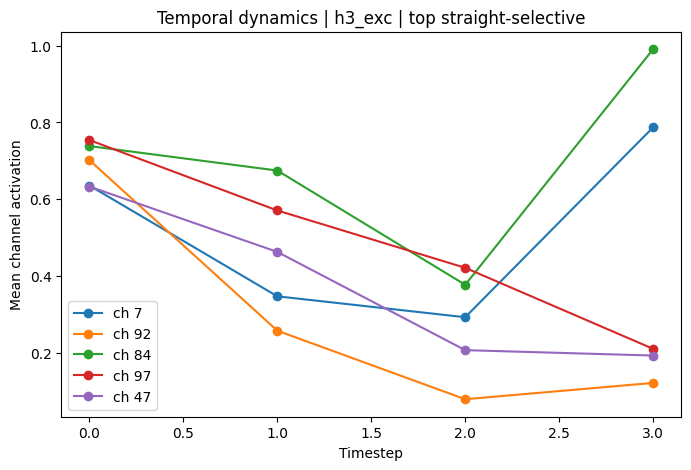

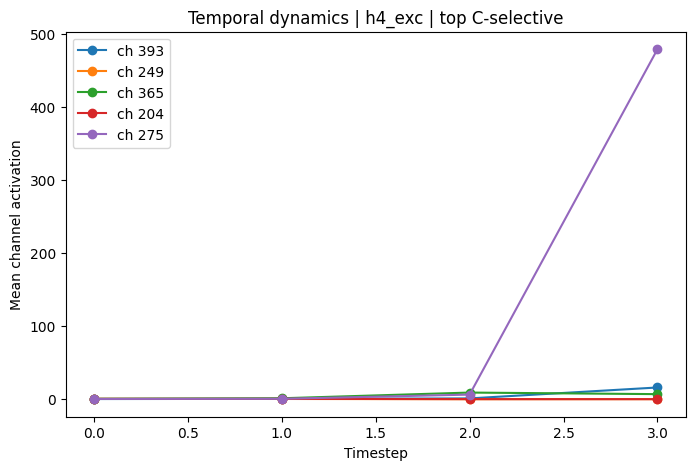

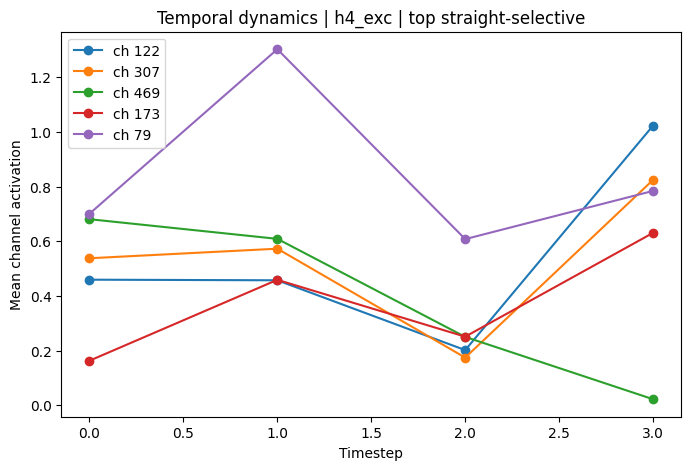

,layer,n_channels,mean_SI,std_SI,max_C_SI,max_straight_SI,n_C_SI>0.08,n_straight_SI<-0.08
0,h1_exc,128,0.001637,0.005186,0.021749,-0.009522,0,0
1,h2_exc,256,0.003709,0.020100,0.118420,-0.052710,3,0
2,h3_exc,512,0.005819,0.048539,0.406390,-0.350431,21,8
3,h4_exc,512,-0.020807,0.068039,0.421326,-0.790512,11,38


In [14]:
from PIL import Image

# ---------- instellingen ----------
TARGET_LAYERS = ['h1_exc', 'h2_exc', 'h3_exc', 'h4_exc']
SI_THRESHOLD = 0.08
TOP_K = 10

# kies voorbeeldstimulus
EXAMPLE_CONTOUR = 'C'
EXAMPLE_CONTRAST = 'high'
EXAMPLE_JITTER = 0   # verander bv naar 30, 58, 60

# ---------- 1. top-selective channels vinden ----------
top_selective = {}

for layer in TARGET_LAYERS:

    if layer not in selectivity_results:
        print(f"Skipping {layer}: no selectivity results")
        continue

    sel = selectivity_results[layer]

    top_c = np.where(sel > SI_THRESHOLD)[0]
    top_straight = np.where(sel < -SI_THRESHOLD)[0]

    # als threshold weinig oplevert, pak top K
    top_c_ranked = np.argsort(sel)[::-1][:TOP_K]
    top_straight_ranked = np.argsort(sel)[:TOP_K]

    top_selective[layer] = {
        'C_threshold': top_c,
        'straight_threshold': top_straight,
        'C_topK': top_c_ranked,
        'straight_topK': top_straight_ranked,
        'SI': sel,
    }

    print("\n==============================")
    print(layer)
    print("==============================")
    print(f"C-selective channels SI > {SI_THRESHOLD}:")
    print(top_c)
    print("Top C-selective channels:")
    print([(int(ch), float(sel[ch])) for ch in top_c_ranked])

    print(f"\nStraight-selective channels SI < -{SI_THRESHOLD}:")
    print(top_straight)
    print("Top straight-selective channels:")
    print([(int(ch), float(sel[ch])) for ch in top_straight_ranked])


# ---------- 2. één stimulus kiezen ----------
subset = dataset_df[
    (dataset_df['contour_type'] == EXAMPLE_CONTOUR) &
    (dataset_df['contrast'] == EXAMPLE_CONTRAST) &
    (dataset_df['jitter'] == EXAMPLE_JITTER)
]

if len(subset) == 0:
    print("Geen stimulus gevonden voor deze selectie. Beschikbare jitters:")
    print(dataset_df.groupby(['contour_type', 'contrast'])['jitter'].unique())
else:
    row = subset.iloc[0]
    img_path = row['path']

    pil_img = Image.open(img_path).convert('RGB')
    img_tensor = transform(pil_img).unsqueeze(0).to(device)

    print("\nVoorbeeldstimulus:")
    print(row[['filename', 'contour_type', 'contrast', 'quadrant', 'position', 'jitter']])


# ---------- 3. forward pass en states ophalen ----------
model.reset_hidden_states()

with torch.no_grad():
    output = model(img_tensor)

print("Output mean:", output.mean().item())


# ---------- 4. spatial activation map plotten ----------
def plot_channel_overlay(
    model,
    layer_name,
    channel,
    pil_img,
    alpha=0.45,
    title_extra=""
):
    """
    Plot channel activation map bovenop de stimulus.
    """

    tensor = getattr(model, layer_name)

    if tensor is None:
        print(f"{layer_name} is None")
        return

    fmap = tensor.detach().cpu()[0, channel]  # [H,W]

    # resize activation map naar input-image grootte
    fmap_resized = F.interpolate(
        fmap[None, None, :, :],
        size=pil_img.size[::-1],
        mode='bilinear',
        align_corners=False
    )[0, 0].numpy()

    # normaliseren voor visualisatie
    fmap_norm = fmap_resized - fmap_resized.min()
    fmap_norm = fmap_norm / (fmap_norm.max() + 1e-8)

    plt.figure(figsize=(6, 6))
    plt.imshow(pil_img)
    plt.imshow(fmap_norm, alpha=alpha)
    plt.axis('off')
    plt.title(
        f"{layer_name} | channel {channel} {title_extra}"
    )
    plt.show()


# ---------- 5. spatial maps voor top C- en straight-channels ----------
for layer in TARGET_LAYERS:

    if layer not in top_selective:
        continue

    print(f"\nSpatial maps for {layer}")

    # top 3 C-selective
    for ch in top_selective[layer]['C_topK'][:3]:
        si = top_selective[layer]['SI'][ch]
        plot_channel_overlay(
            model,
            layer,
            int(ch),
            pil_img,
            title_extra=f"| C-selective SI={si:.3f}"
        )

    # top 3 straight-selective
    for ch in top_selective[layer]['straight_topK'][:3]:
        si = top_selective[layer]['SI'][ch]
        plot_channel_overlay(
            model,
            layer,
            int(ch),
            pil_img,
            title_extra=f"| straight-selective SI={si:.3f}"
        )


# ---------- 6. temporal activity analyse ----------
def extract_temporal_channel_response(model, layer_name, channel):
    """
    Haalt per timestep de gemiddelde activatie van één channel op.
    Werkt met model.temporal_activity.
    """

    if not hasattr(model, 'temporal_activity'):
        print("Model heeft geen temporal_activity.")
        return None

    if layer_name not in model.temporal_activity:
        print(f"{layer_name} niet gevonden in temporal_activity.")
        print("Beschikbaar:", model.temporal_activity.keys())
        return None

    responses = []

    for state in model.temporal_activity[layer_name]:
        # state: [B,C,H,W]
        r = state[0, channel].mean().item()
        responses.append(r)

    return np.array(responses)


def plot_temporal_response(model, layer_name, channels, label):
    """
    Plot temporal dynamics voor meerdere channels.
    """

    plt.figure(figsize=(8, 5))

    for ch in channels:
        responses = extract_temporal_channel_response(
            model,
            layer_name,
            int(ch)
        )

        if responses is not None:
            plt.plot(
                np.arange(len(responses)),
                responses,
                marker='o',
                label=f"ch {int(ch)}"
            )

    plt.xlabel("Timestep")
    plt.ylabel("Mean channel activation")
    plt.title(f"Temporal dynamics | {layer_name} | {label}")
    plt.legend()
    plt.show()


# ---------- 7. temporal plots voor top channels ----------
for layer in TARGET_LAYERS:

    if layer not in top_selective:
        continue

    plot_temporal_response(
        model,
        layer,
        top_selective[layer]['C_topK'][:5],
        label='top C-selective'
    )

    plot_temporal_response(
        model,
        layer,
        top_selective[layer]['straight_topK'][:5],
        label='top straight-selective'
    )


# ---------- 8. samenvattingstabel maken ----------
summary_rows = []

for layer in TARGET_LAYERS:

    if layer not in top_selective:
        continue

    sel = top_selective[layer]['SI']

    summary_rows.append({
        'layer': layer,
        'n_channels': len(sel),
        'mean_SI': np.mean(sel),
        'std_SI': np.std(sel),
        'max_C_SI': np.max(sel),
        'max_straight_SI': np.min(sel),
        f'n_C_SI>{SI_THRESHOLD}': len(top_selective[layer]['C_threshold']),
        f'n_straight_SI<-{SI_THRESHOLD}': len(top_selective[layer]['straight_threshold']),
    })

selectivity_summary_df = pd.DataFrame(summary_rows)
selectivity_summary_df

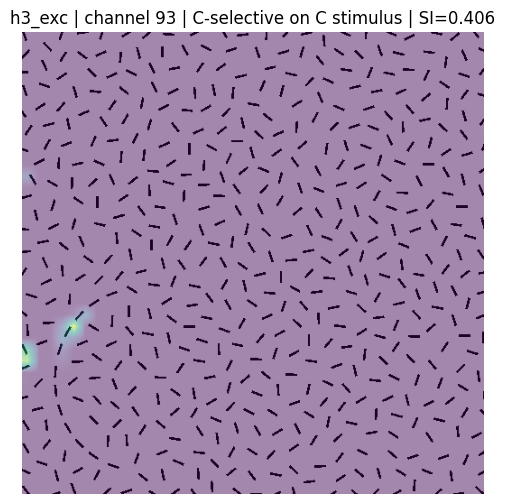

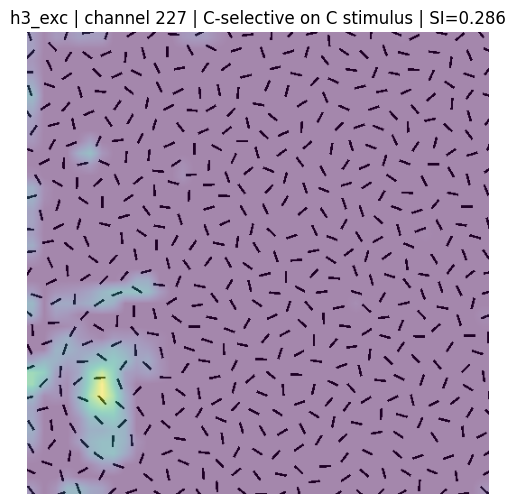

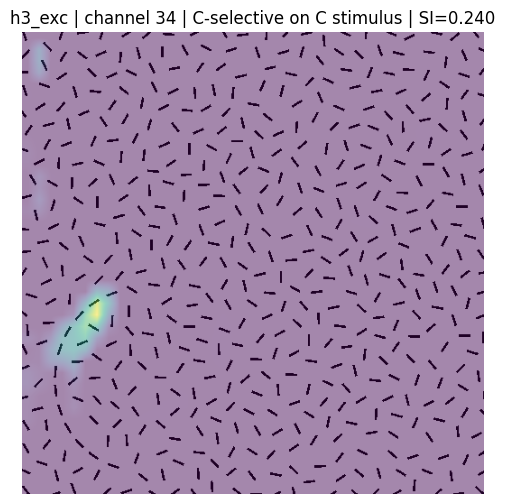

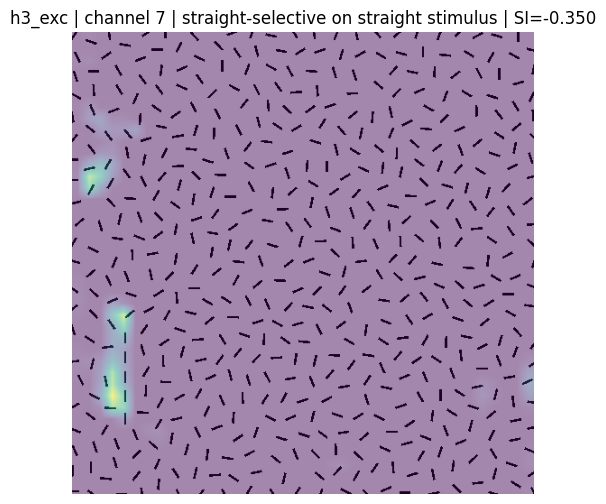

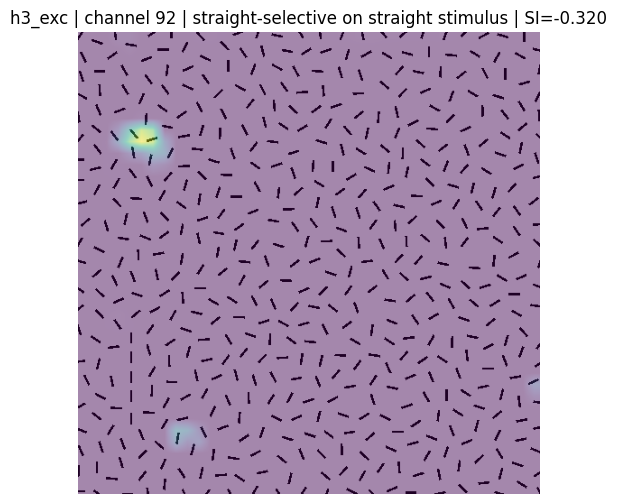

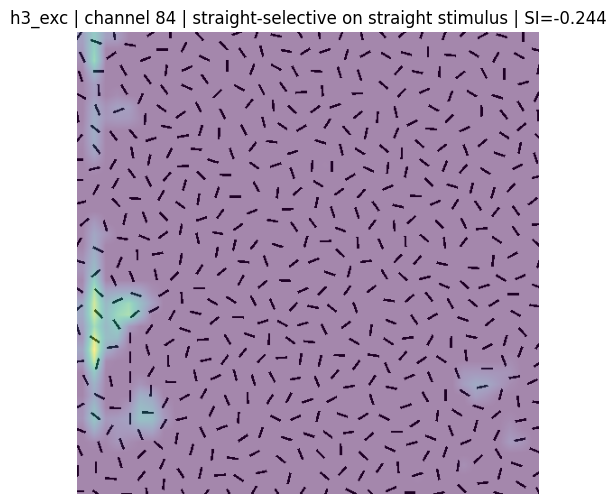

In [15]:
def get_example_stimulus(contour_type, contrast='high', jitter=0):
    subset = dataset_df[
        (dataset_df['contour_type'] == contour_type) &
        (dataset_df['contrast'] == contrast) &
        (dataset_df['jitter'] == jitter)
    ]

    if len(subset) == 0:
        print(f"No image found for {contour_type}, {contrast}, jitter {jitter}")
        return None, None

    row = subset.iloc[0]
    pil_img = Image.open(row['path']).convert('RGB')
    img_tensor = transform(pil_img).unsqueeze(0).to(device)

    return pil_img, img_tensor


def run_stimulus(model, img_tensor):
    model.reset_hidden_states()

    with torch.no_grad():
        output = model(img_tensor)

    return output.mean().item()


# kies instellingen
CONTRAST = 'high'
JITTER = 0
LAYER = 'h3_exc'

# laad preferred stimuli
c_img, c_tensor = get_example_stimulus('C', CONTRAST, JITTER)
s_img, s_tensor = get_example_stimulus('straight', CONTRAST, JITTER)

# kies channels
top_c_channels = top_selective[LAYER]['C_topK'][:3]
top_straight_channels = top_selective[LAYER]['straight_topK'][:3]

# C-selective channels op C-stimulus
if c_tensor is not None:
    run_stimulus(model, c_tensor)

    for ch in top_c_channels:
        si = top_selective[LAYER]['SI'][ch]
        plot_channel_overlay(
            model,
            LAYER,
            int(ch),
            c_img,
            title_extra=f"| C-selective on C stimulus | SI={si:.3f}"
        )

# straight-selective channels op straight-stimulus
if s_tensor is not None:
    run_stimulus(model, s_tensor)

    for ch in top_straight_channels:
        si = top_selective[LAYER]['SI'][ch]
        plot_channel_overlay(
            model,
            LAYER,
            int(ch),
            s_img,
            title_extra=f"| straight-selective on straight stimulus | SI={si:.3f}"
        )

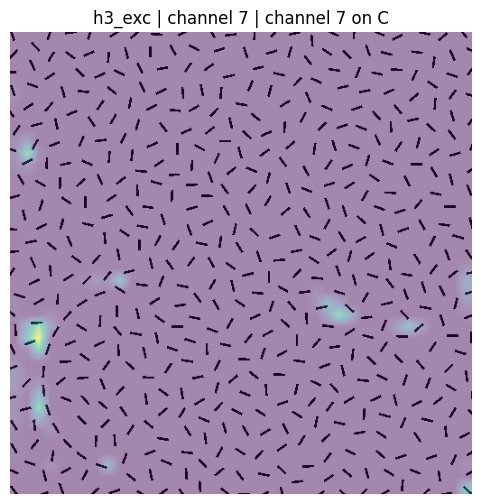

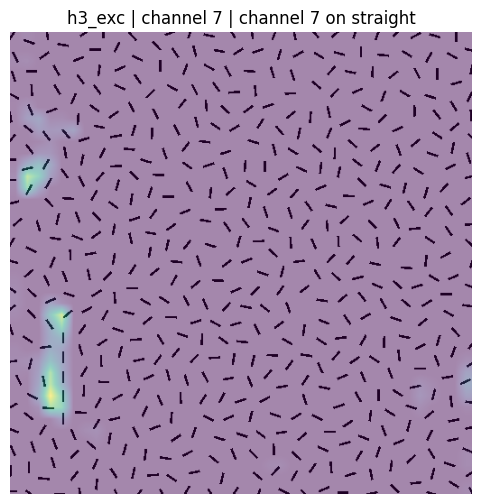

In [16]:
def compare_channel_on_C_vs_straight(layer, channel, contrast='high', jitter=0):

    c_img, c_tensor = get_example_stimulus('C', contrast, jitter)
    s_img, s_tensor = get_example_stimulus('straight', contrast, jitter)

    if c_tensor is not None:
        run_stimulus(model, c_tensor)
        plot_channel_overlay(
            model,
            layer,
            int(channel),
            c_img,
            title_extra=f"| channel {channel} on C"
        )

    if s_tensor is not None:
        run_stimulus(model, s_tensor)
        plot_channel_overlay(
            model,
            layer,
            int(channel),
            s_img,
            title_extra=f"| channel {channel} on straight"
        )


# voorbeeld:
compare_channel_on_C_vs_straight(
    layer='h3_exc',
    channel=7,
    contrast='high',
    jitter=0
)

# CHECK: SPATIAL MAPS + TEMPORAL DYNAMICS
### Preferred vs non-preferred stimuli


\n======================================================================
h3 C-selective
Preferred stimulus:
filename        C_high_BL_0_J000_008.png
contour_type                           C
contrast                            high
jitter                                 0
quadrant                              BL
Name: 73, dtype: object
\nNon-preferred stimulus:
filename        straight_high_BL_0_J000_003.png
contour_type                           straight
contrast                                   high
jitter                                        0
quadrant                                     BL
Name: 9, dtype: object
\nChannel 93 | SI=0.406


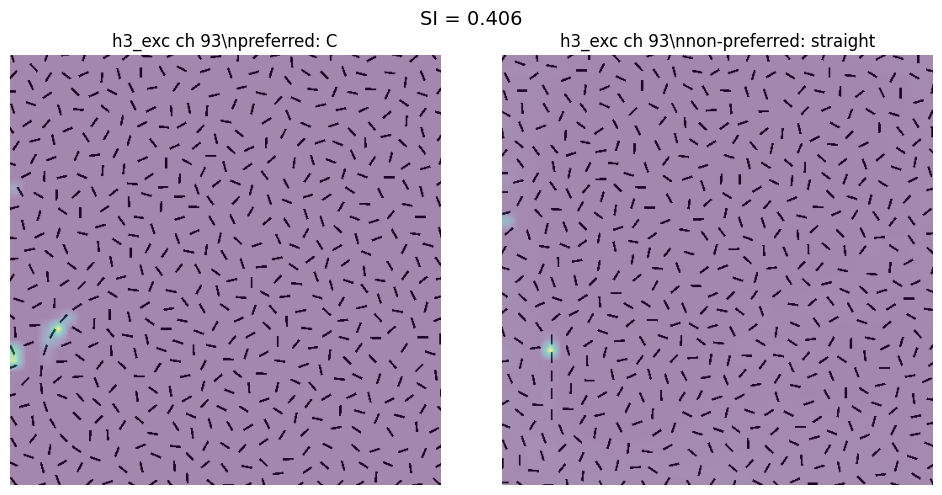

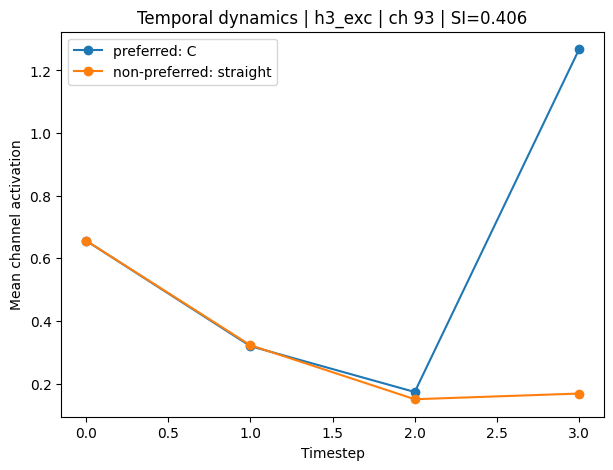

\nChannel 227 | SI=0.286


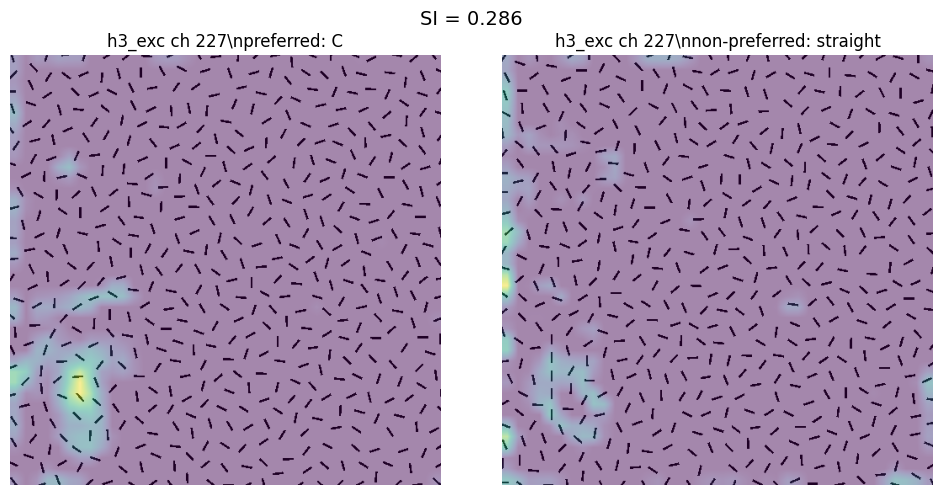

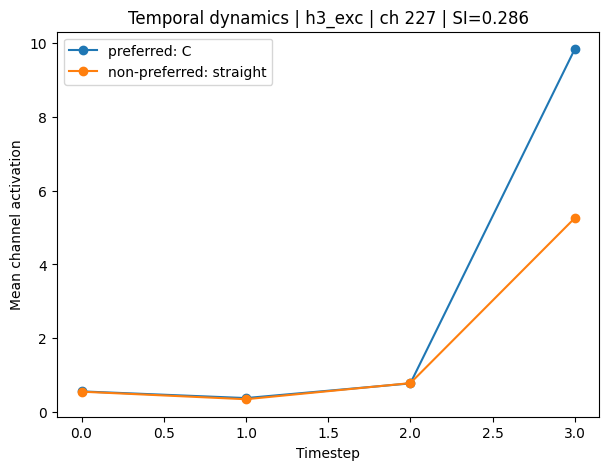

\nChannel 34 | SI=0.240


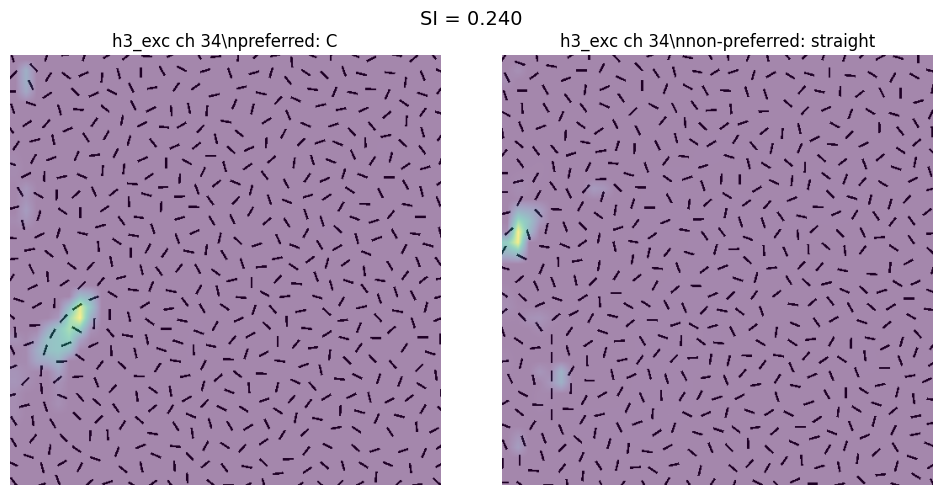

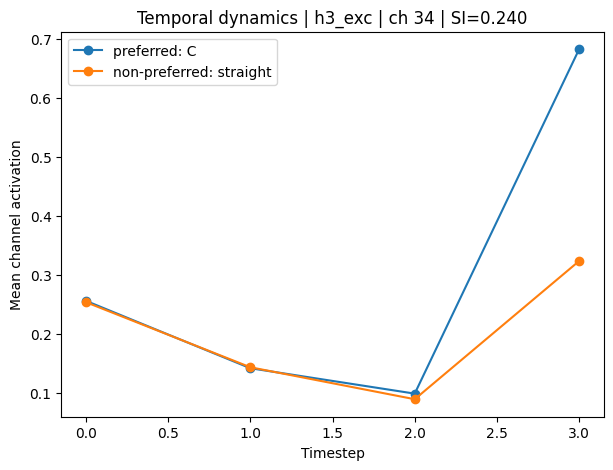

\nChannel 127 | SI=0.217


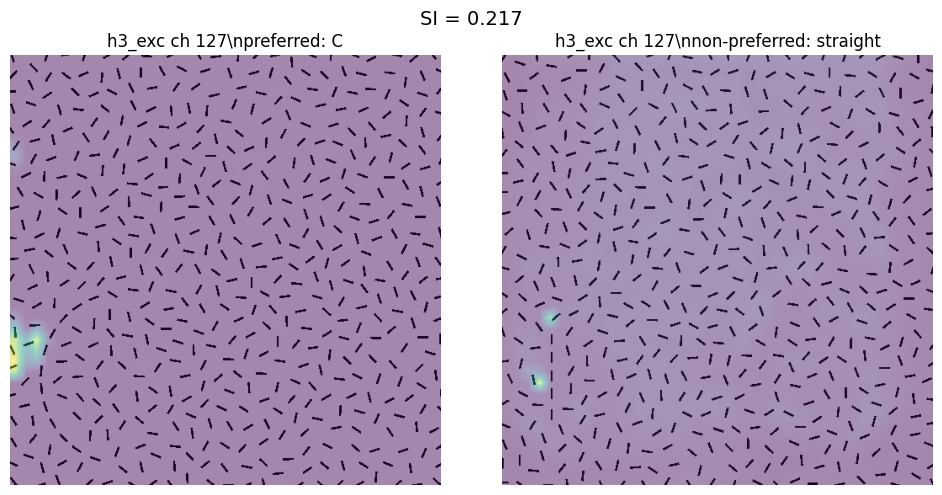

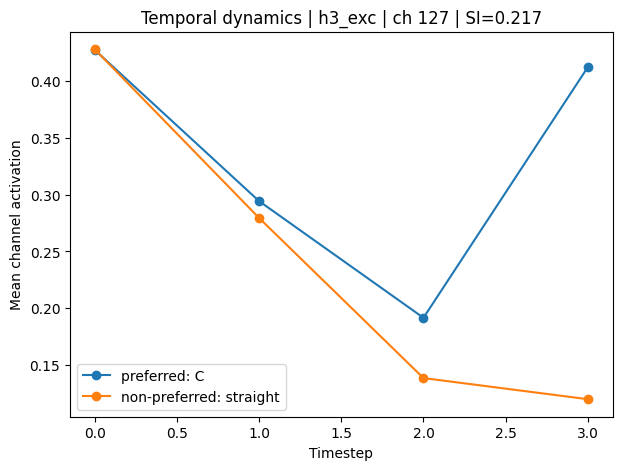

\nChannel 49 | SI=0.213


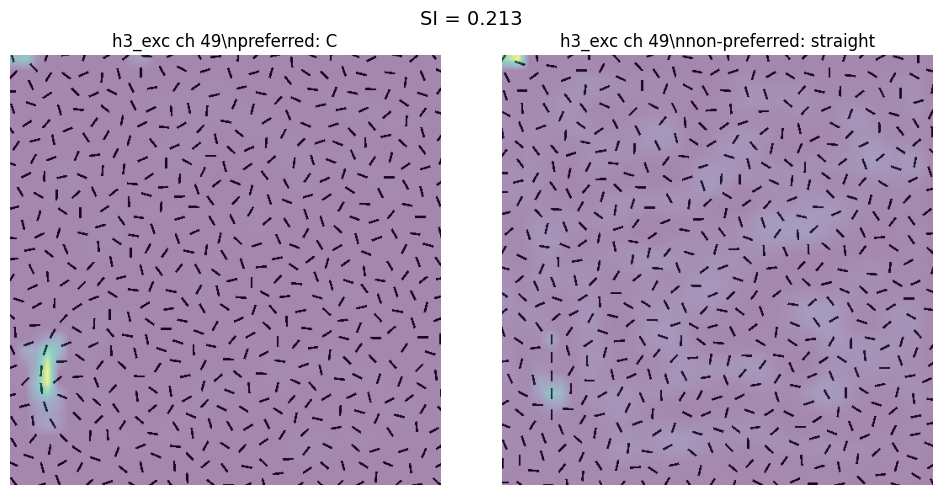

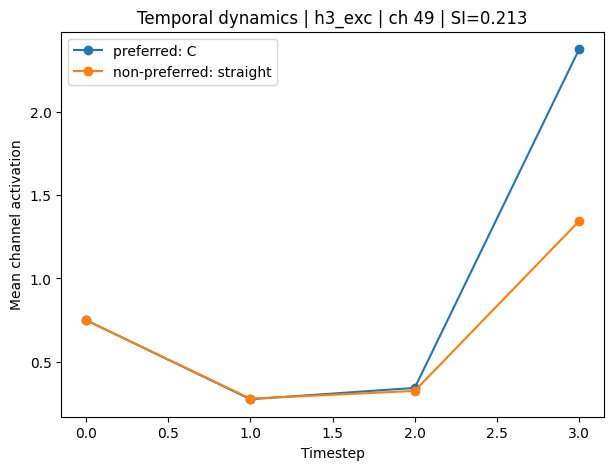

\n======================================================================
h4 straight-selective
Preferred stimulus:
filename        straight_high_BL_0_J000_003.png
contour_type                           straight
contrast                                   high
jitter                                        0
quadrant                                     BL
Name: 9, dtype: object
\nNon-preferred stimulus:
filename        C_high_BL_0_J000_008.png
contour_type                           C
contrast                            high
jitter                                 0
quadrant                              BL
Name: 73, dtype: object
\nChannel 122 | SI=-0.791


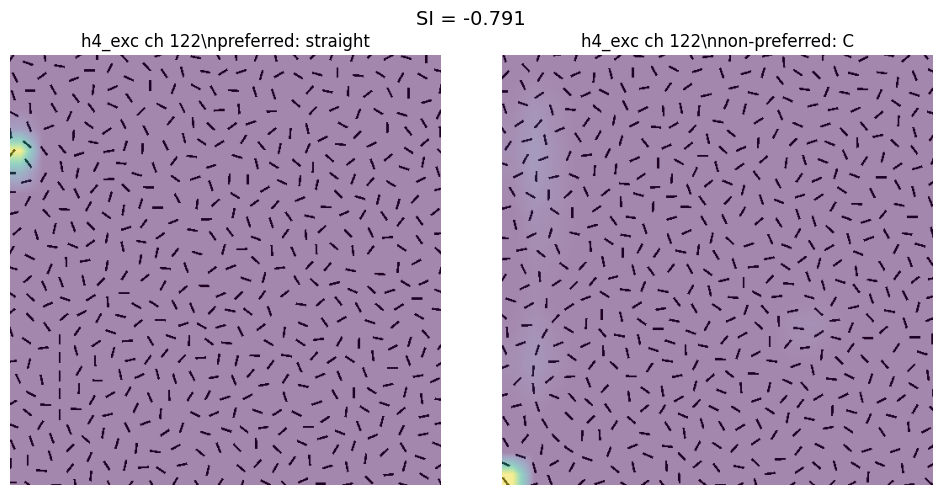

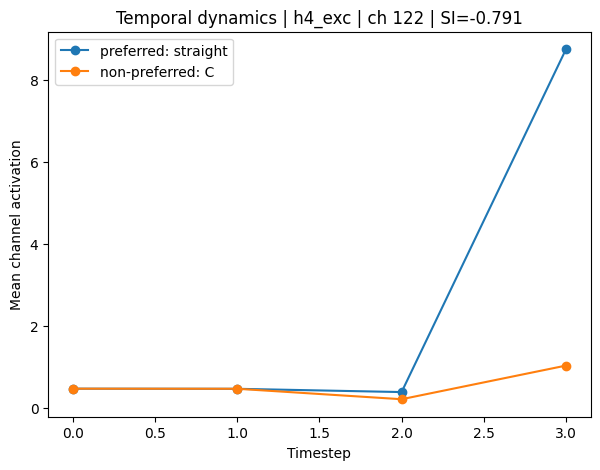

\nChannel 307 | SI=-0.502


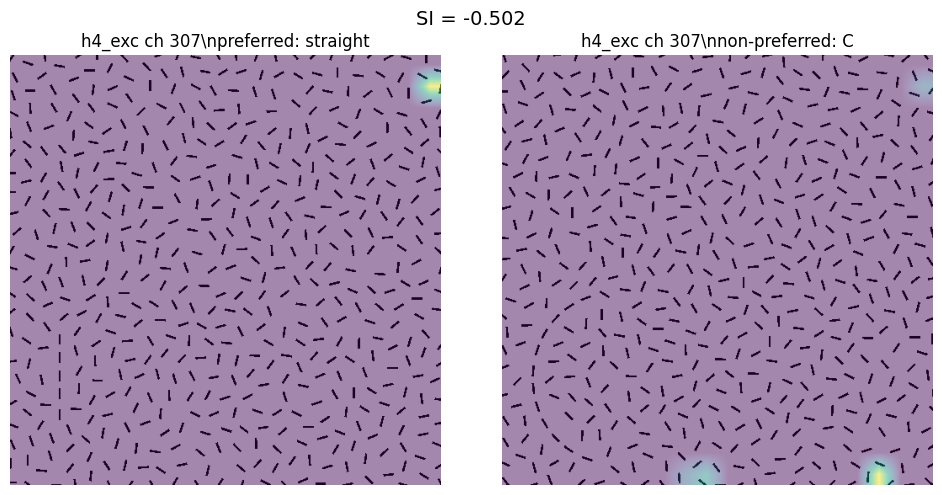

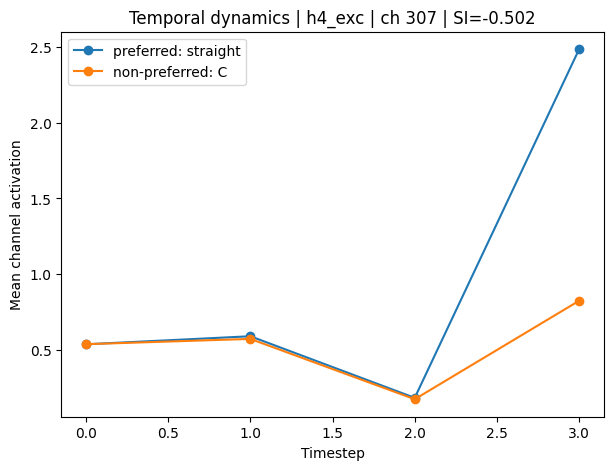

\nChannel 469 | SI=-0.288


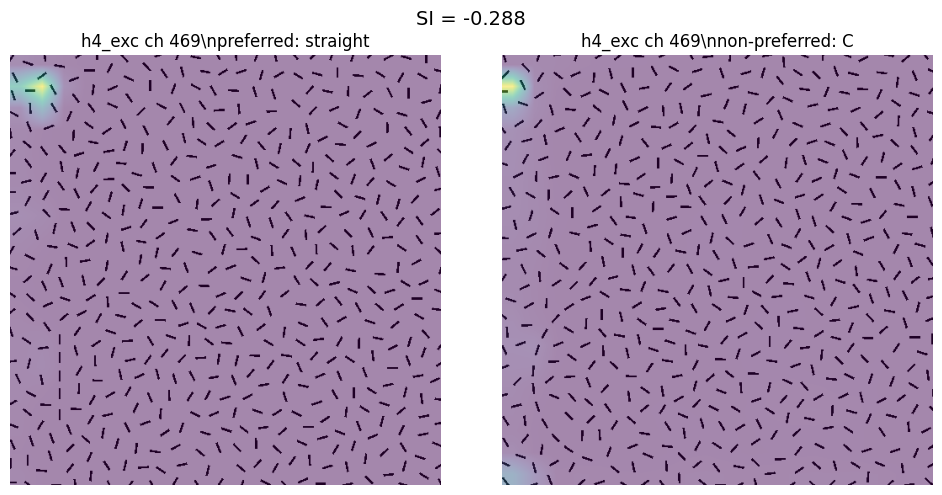

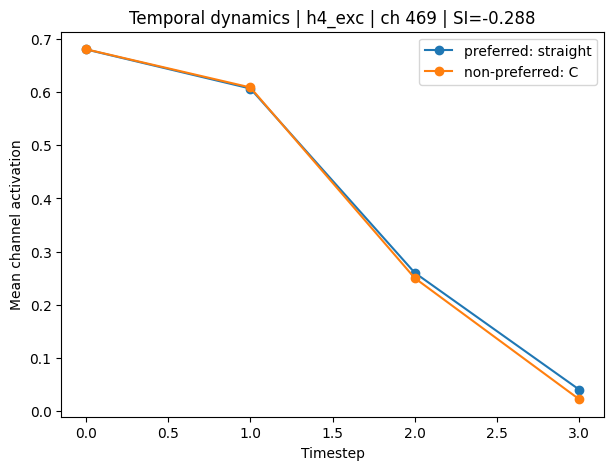

\nChannel 173 | SI=-0.253


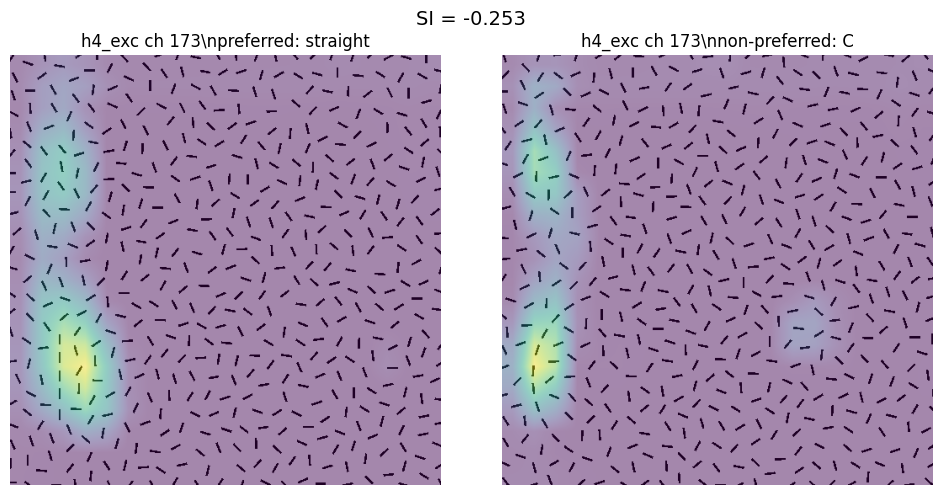

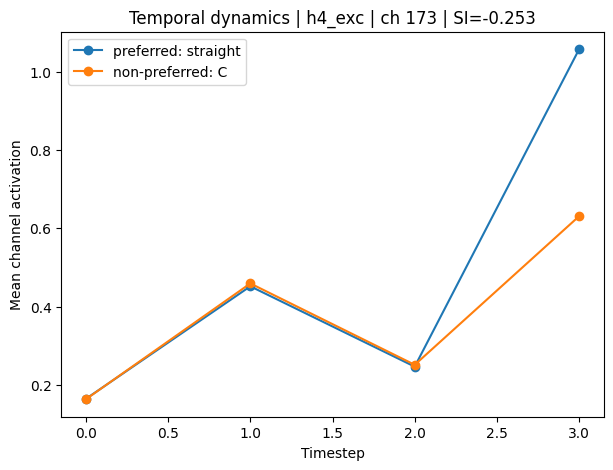

\nChannel 79 | SI=-0.245


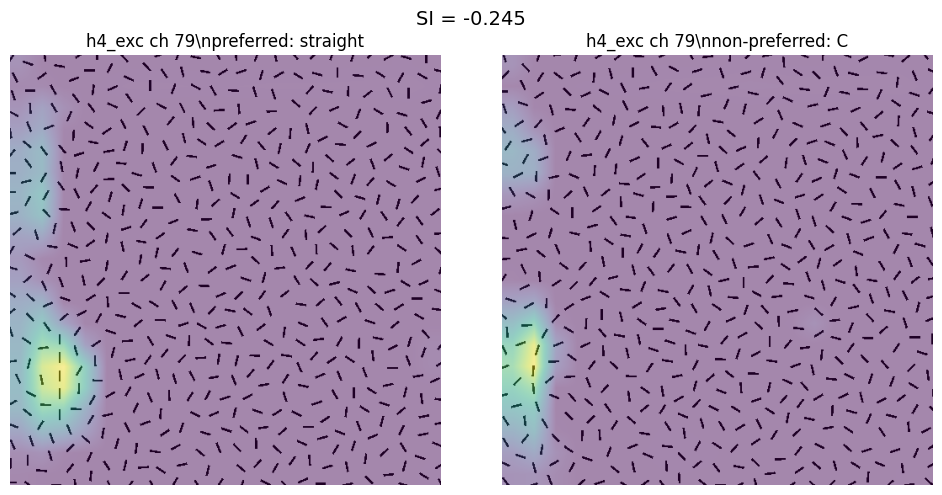

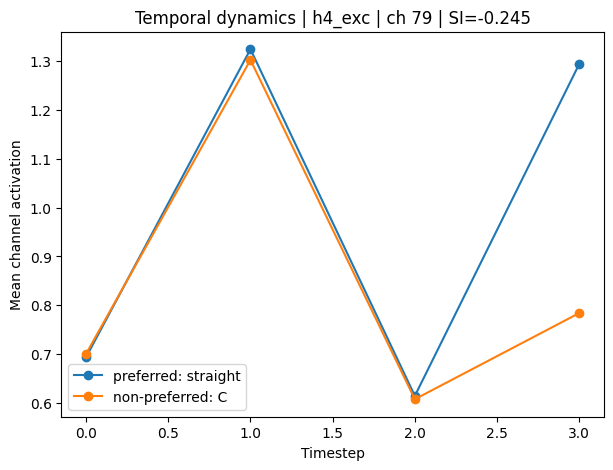

,analysis,layer,channel,SI,preferred,nonpreferred,pref_t0,pref_tfinal,pref_growth,nonpref_t0,nonpref_tfinal,nonpref_growth,final_difference_pref_minus_nonpref,growth_difference_pref_minus_nonpref
0,h3 C-selective,h3_exc,93,0.406390,C,straight,0.656484,1.267693,0.611208,0.656681,0.168028,-0.488653,1.099665,1.099862
1,h3 C-selective,h3_exc,227,0.286350,C,straight,0.561554,9.828350,9.266796,0.553615,5.254543,4.700928,4.573807,4.565868
2,h3 C-selective,h3_exc,34,0.239946,C,straight,0.255581,0.682119,0.426538,0.253289,0.323076,0.069788,0.359043,0.356750
3,h3 C-selective,h3_exc,127,0.216614,C,straight,0.427424,0.412255,-0.015169,0.427978,0.119881,-0.308097,0.292374,0.292928
4,h3 C-selective,h3_exc,49,0.212723,C,straight,0.749799,2.376852,1.627053,0.749203,1.344286,0.595083,1.032566,1.031971
5,h4 straight-selective,h4_exc,122,-0.790512,straight,C,0.459264,8.742304,8.283039,0.459454,1.022839,0.563385,7.719465,7.719655
6,h4 straight-selective,h4_exc,307,-0.501751,straight,C,0.537141,2.485022,1.947881,0.537806,0.824476,0.286670,1.660545,1.661211
7,h4 straight-selective,h4_exc,469,-0.288204,straight,C,0.680320,0.040597,-0.639723,0.680626,0.022432,-0.658194,0.018165,0.018471
8,h4 straight-selective,h4_exc,173,-0.252662,straight,C,0.164234,1.057260,0.893026,0.163230,0.630762,0.467532,0.426498,0.425494
9,h4 straight-selective,h4_exc,79,-0.245297,straight,C,0.693747,1.293767,0.600020,0.700565,0.784078,0.083513,0.509689,0.516507


In [17]:
from PIL import Image

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

CONTRAST = "high"
JITTER = 0

N_CHANNELS_TO_CHECK = 5

CHECKS = [
    {
        "layer": "h3_exc",
        "channel_type": "C_topK",
        "preferred": "C",
        "nonpreferred": "straight",
        "label": "h3 C-selective"
    },
    {
        "layer": "h4_exc",
        "channel_type": "straight_topK",
        "preferred": "straight",
        "nonpreferred": "C",
        "label": "h4 straight-selective"
    }
]


# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------

def get_example_stimulus(contour_type, contrast="high", jitter=0, index=0):
    subset = dataset_df[
        (dataset_df["contour_type"] == contour_type) &
        (dataset_df["contrast"] == contrast) &
        (dataset_df["jitter"] == jitter)
    ]

    if len(subset) == 0:
        print(f"No image found for {contour_type}, {contrast}, jitter {jitter}")
        return None, None, None

    row = subset.iloc[index % len(subset)]
    pil_img = Image.open(row["path"]).convert("RGB")
    img_tensor = transform(pil_img).unsqueeze(0).to(device)

    return pil_img, img_tensor, row


def run_model_and_get_state(model, img_tensor):
    model.reset_hidden_states()

    with torch.no_grad():
        output = model(img_tensor)

    return output.mean().item()


def get_channel_map(model, layer_name, channel, pil_img):
    tensor = getattr(model, layer_name)

    fmap = tensor.detach().cpu()[0, channel]

    fmap_resized = F.interpolate(
        fmap[None, None, :, :],
        size=pil_img.size[::-1],
        mode="bilinear",
        align_corners=False
    )[0, 0].numpy()

    fmap_norm = fmap_resized - fmap_resized.min()
    fmap_norm = fmap_norm / (fmap_norm.max() + 1e-8)

    return fmap_norm


def plot_preferred_vs_nonpreferred_spatial(
    model,
    layer,
    channel,
    preferred_img,
    preferred_tensor,
    nonpreferred_img,
    nonpreferred_tensor,
    preferred_label,
    nonpreferred_label,
    si=None
):
    run_model_and_get_state(model, preferred_tensor)
    pref_map = get_channel_map(model, layer, channel, preferred_img)

    run_model_and_get_state(model, nonpreferred_tensor)
    nonpref_map = get_channel_map(model, layer, channel, nonpreferred_img)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(preferred_img)
    axes[0].imshow(pref_map, alpha=0.45)
    axes[0].set_title(f"{layer} ch {channel}\\npreferred: {preferred_label}")
    axes[0].axis("off")

    axes[1].imshow(nonpreferred_img)
    axes[1].imshow(nonpref_map, alpha=0.45)
    axes[1].set_title(f"{layer} ch {channel}\\nnon-preferred: {nonpreferred_label}")
    axes[1].axis("off")

    if si is not None:
        fig.suptitle(f"SI = {si:.3f}", fontsize=14)

    plt.tight_layout()
    plt.show()


def get_temporal_response(model, img_tensor, layer, channel):
    model.reset_hidden_states()

    with torch.no_grad():
        _ = model(img_tensor)

    if not hasattr(model, "temporal_activity"):
        raise ValueError("model.temporal_activity bestaat niet.")

    if layer not in model.temporal_activity:
        raise ValueError(
            f"{layer} niet in temporal_activity. Beschikbaar: "
            f"{list(model.temporal_activity.keys())}"
        )

    responses = []

    for state in model.temporal_activity[layer]:
        r = state[0, channel].mean().item()
        responses.append(r)

    return np.array(responses)


def plot_temporal_preferred_vs_nonpreferred(
    model,
    layer,
    channel,
    preferred_tensor,
    nonpreferred_tensor,
    preferred_label,
    nonpreferred_label,
    si=None
):
    pref_resp = get_temporal_response(
        model,
        preferred_tensor,
        layer,
        channel
    )

    nonpref_resp = get_temporal_response(
        model,
        nonpreferred_tensor,
        layer,
        channel
    )

    plt.figure(figsize=(7, 5))

    plt.plot(
        np.arange(len(pref_resp)),
        pref_resp,
        marker="o",
        label=f"preferred: {preferred_label}"
    )

    plt.plot(
        np.arange(len(nonpref_resp)),
        nonpref_resp,
        marker="o",
        label=f"non-preferred: {nonpreferred_label}"
    )

    plt.xlabel("Timestep")
    plt.ylabel("Mean channel activation")

    title = f"Temporal dynamics | {layer} | ch {channel}"
    if si is not None:
        title += f" | SI={si:.3f}"

    plt.title(title)
    plt.legend()
    plt.show()

    return pref_resp, nonpref_resp


# ------------------------------------------------------------
# Run checks
# ------------------------------------------------------------

summary_rows = []

for check in CHECKS:

    layer = check["layer"]
    channel_type = check["channel_type"]
    preferred = check["preferred"]
    nonpreferred = check["nonpreferred"]
    label = check["label"]

    print("\\n" + "=" * 70)
    print(label)
    print("=" * 70)

    channels = top_selective[layer][channel_type][:N_CHANNELS_TO_CHECK]
    si_values = top_selective[layer]["SI"]

    preferred_img, preferred_tensor, preferred_row = get_example_stimulus(
        preferred,
        contrast=CONTRAST,
        jitter=JITTER
    )

    nonpreferred_img, nonpreferred_tensor, nonpreferred_row = get_example_stimulus(
        nonpreferred,
        contrast=CONTRAST,
        jitter=JITTER
    )

    if preferred_tensor is None or nonpreferred_tensor is None:
        print("Skipping because one stimulus type is missing.")
        continue

    print("Preferred stimulus:")
    print(preferred_row[["filename", "contour_type", "contrast", "jitter", "quadrant"]])

    print("\\nNon-preferred stimulus:")
    print(nonpreferred_row[["filename", "contour_type", "contrast", "jitter", "quadrant"]])

    for ch in channels:

        ch = int(ch)
        si = float(si_values[ch])

        print(f"\\nChannel {ch} | SI={si:.3f}")

        # Spatial maps
        plot_preferred_vs_nonpreferred_spatial(
            model=model,
            layer=layer,
            channel=ch,
            preferred_img=preferred_img,
            preferred_tensor=preferred_tensor,
            nonpreferred_img=nonpreferred_img,
            nonpreferred_tensor=nonpreferred_tensor,
            preferred_label=preferred,
            nonpreferred_label=nonpreferred,
            si=si
        )

        # Temporal dynamics
        pref_resp, nonpref_resp = plot_temporal_preferred_vs_nonpreferred(
            model=model,
            layer=layer,
            channel=ch,
            preferred_tensor=preferred_tensor,
            nonpreferred_tensor=nonpreferred_tensor,
            preferred_label=preferred,
            nonpreferred_label=nonpreferred,
            si=si
        )

        summary_rows.append({
            "analysis": label,
            "layer": layer,
            "channel": ch,
            "SI": si,
            "preferred": preferred,
            "nonpreferred": nonpreferred,
            "pref_t0": pref_resp[0],
            "pref_tfinal": pref_resp[-1],
            "pref_growth": pref_resp[-1] - pref_resp[0],
            "nonpref_t0": nonpref_resp[0],
            "nonpref_tfinal": nonpref_resp[-1],
            "nonpref_growth": nonpref_resp[-1] - nonpref_resp[0],
            "final_difference_pref_minus_nonpref": pref_resp[-1] - nonpref_resp[-1],
            "growth_difference_pref_minus_nonpref": (
                pref_resp[-1] - pref_resp[0]
            ) - (
                nonpref_resp[-1] - nonpref_resp[0]
            )
        })


check_summary_df = pd.DataFrame(summary_rows)

check_summary_df

# Attention pipeline
### Candidate channels → modulation during recurrent processing → baseline vs attention comparison

In [18]:
# ============================================================
# 1. SELECTEER KANDIDAAT-CHANNELS
# ============================================================

def select_attention_candidates(
    selectivity_results,
    layer,
    preferred="C",
    top_k=5,
    threshold=0.08,
):
    sel = selectivity_results[layer]

    if preferred == "C":
        ranked = np.argsort(sel)[::-1]
        threshold_channels = np.where(sel > threshold)[0]

    elif preferred == "straight":
        ranked = np.argsort(sel)
        threshold_channels = np.where(sel < -threshold)[0]

    else:
        raise ValueError("preferred moet 'C' of 'straight' zijn")

    top_channels = ranked[:top_k]

    candidate_df = pd.DataFrame({
        "layer": layer,
        "preferred": preferred,
        "channel": top_channels,
        "SI": sel[top_channels],
        "passes_threshold": np.isin(top_channels, threshold_channels),
    })

    return list(map(int, top_channels)), candidate_df


# Voorlopige beste kandidaten op basis van je huidige resultaten
C_LAYER = "h3_exc"
STRAIGHT_LAYER = "h4_exc"

C_CHANNELS, C_candidate_df = select_attention_candidates(
    selectivity_results,
    layer=C_LAYER,
    preferred="C",
    top_k=5,
    threshold=0.08,
)

STRAIGHT_CHANNELS, straight_candidate_df = select_attention_candidates(
    selectivity_results,
    layer=STRAIGHT_LAYER,
    preferred="straight",
    top_k=5,
    threshold=0.08,
)

candidate_df = pd.concat(
    [C_candidate_df, straight_candidate_df],
    ignore_index=True
)

candidate_df

,layer,preferred,channel,SI,passes_threshold
0,h3_exc,C,93,0.406390,True
1,h3_exc,C,227,0.286350,True
2,h3_exc,C,34,0.239946,True
3,h3_exc,C,127,0.216614,True
4,h3_exc,C,49,0.212723,True
5,h4_exc,straight,122,-0.790512,True
6,h4_exc,straight,307,-0.501751,True
7,h4_exc,straight,469,-0.288204,True
8,h4_exc,straight,173,-0.252662,True
9,h4_exc,straight,79,-0.245297,True


In [19]:
# ============================================================
# 2. ATTENTION FORWARD PASS VOOR VGG16GammaNetV2
# ============================================================

def apply_attention_to_state(
    model,
    attention_type,
    target_layer,
    target_channels,
    gain=1.25,
    inhibition_factor=0.75,
    bias_strength=0.15,
):
    """
    Past attention toe op een bestaande hidden state.
    
    attention_type:
    - 'gain': versterkt excitatory state
    - 'inhibition': verlaagt inhibitory state
    - 'topdown_bias': voegt positieve bias toe
    """

    if target_channels is None or len(target_channels) == 0:
        return

    if not hasattr(model, target_layer):
        return

    state = getattr(model, target_layer)

    if state is None:
        return

    if attention_type == "gain":
        state[:, target_channels] = state[:, target_channels] * gain

    elif attention_type == "topdown_bias":
        state[:, target_channels] = state[:, target_channels] + bias_strength

    elif attention_type == "inhibition":
        inh_layer = target_layer.replace("_exc", "_inh")

        if hasattr(model, inh_layer):
            inh_state = getattr(model, inh_layer)

            if inh_state is not None:
                inh_state[:, target_channels] = (
                    inh_state[:, target_channels] * inhibition_factor
                )

    else:
        raise ValueError(f"Unknown attention_type: {attention_type}")


def forward_with_attention(
    model,
    x,
    attention_type=None,
    target_layer=None,
    target_channels=None,
    gain=1.25,
    inhibition_factor=0.75,
    bias_strength=0.15,
    apply_from_timestep=1,
):
    """
    Forward pass waarin attention tijdens recurrente verwerking wordt toegepast.
    Deze functie is specifiek voor VGG16GammaNetV2.
    """

    batch_size = x.shape[0]
    device = x.device

    if model.h0_exc is None or model.h0_exc.shape[0] != batch_size:
        model.init_hidden_states(batch_size, x.shape[2], x.shape[3], device)

    model.temporal_activity = {
        "h0_exc": [],
        "h1_exc": [],
        "h2_exc": [],
        "h3_exc": [],
        "h4_exc": [],
        "td_h0_exc": [],
        "td_h1_exc": [],
        "td_h2_exc": [],
        "td_h3_exc": [],
    }

    for t in range(model.timesteps):

        # --------------------
        # Bottom-up
        # --------------------
        x1 = model.block1_conv(x)

        if model.use_separate_ei_states:
            model.h0_exc, model.h0_inh, _ = model.fgru_0(
                x1, model.h0_exc, model.h0_inh
            )
        else:
            model.h0_exc, _, _ = model.fgru_0(x1, model.h0_exc)

        if attention_type and target_layer == "h0_exc" and t >= apply_from_timestep:
            apply_attention_to_state(
                model, attention_type, target_layer, target_channels,
                gain, inhibition_factor, bias_strength
            )

        model.temporal_activity["h0_exc"].append(model.h0_exc.detach().cpu())
        x1 = model.pool1(model.align_0(model.h0_exc))

        x2 = model.block2_conv(x1)

        if model.use_separate_ei_states:
            model.h1_exc, model.h1_inh, _ = model.fgru_1(
                x2, model.h1_exc, model.h1_inh
            )
        else:
            model.h1_exc, _, _ = model.fgru_1(x2, model.h1_exc)

        if attention_type and target_layer == "h1_exc" and t >= apply_from_timestep:
            apply_attention_to_state(
                model, attention_type, target_layer, target_channels,
                gain, inhibition_factor, bias_strength
            )

        model.temporal_activity["h1_exc"].append(model.h1_exc.detach().cpu())
        x2 = model.pool2(model.align_1(model.h1_exc))

        x3 = model.block3_conv(x2)

        if model.use_separate_ei_states:
            model.h2_exc, model.h2_inh, _ = model.fgru_2(
                x3, model.h2_exc, model.h2_inh
            )
        else:
            model.h2_exc, _, _ = model.fgru_2(x3, model.h2_exc)

        if attention_type and target_layer == "h2_exc" and t >= apply_from_timestep:
            apply_attention_to_state(
                model, attention_type, target_layer, target_channels,
                gain, inhibition_factor, bias_strength
            )

        model.temporal_activity["h2_exc"].append(model.h2_exc.detach().cpu())
        x3 = model.pool3(model.align_2(model.h2_exc))

        x4 = model.block4_conv(x3)

        if model.use_separate_ei_states:
            model.h3_exc, model.h3_inh, _ = model.fgru_3(
                x4, model.h3_exc, model.h3_inh
            )
        else:
            model.h3_exc, _, _ = model.fgru_3(x4, model.h3_exc)

        if attention_type and target_layer == "h3_exc" and t >= apply_from_timestep:
            apply_attention_to_state(
                model, attention_type, target_layer, target_channels,
                gain, inhibition_factor, bias_strength
            )

        model.temporal_activity["h3_exc"].append(model.h3_exc.detach().cpu())
        x4 = model.pool4(model.align_3(model.h3_exc))

        x5 = model.block5_conv(x4)

        if model.use_separate_ei_states:
            model.h4_exc, model.h4_inh, _ = model.fgru_4(
                x5, model.h4_exc, model.h4_inh
            )
        else:
            model.h4_exc, _, _ = model.fgru_4(x5, model.h4_exc)

        if attention_type and target_layer == "h4_exc" and t >= apply_from_timestep:
            apply_attention_to_state(
                model, attention_type, target_layer, target_channels,
                gain, inhibition_factor, bias_strength
            )

        model.temporal_activity["h4_exc"].append(model.h4_exc.detach().cpu())

        # --------------------
        # Top-down
        # --------------------
        td_4_to_3 = model.td_fgru_4_to_3(model.h4_exc)
        td_4_to_3 = F.interpolate(
            td_4_to_3,
            size=model.h3_exc.shape[2:],
            mode="bilinear",
            align_corners=False,
        )

        if model.use_separate_ei_states:
            model.td_h3_exc, model.td_h3_inh, _ = model.td_fgru_3(
                td_4_to_3, model.td_h3_exc, model.td_h3_inh
            )
        else:
            model.td_h3_exc, _, _ = model.td_fgru_3(td_4_to_3, model.td_h3_exc)

        if attention_type and target_layer == "td_h3_exc" and t >= apply_from_timestep:
            apply_attention_to_state(
                model, attention_type, target_layer, target_channels,
                gain, inhibition_factor, bias_strength
            )

        model.temporal_activity["td_h3_exc"].append(model.td_h3_exc.detach().cpu())

        model.h3_exc = model.h3_exc + model.td_h3_exc if model.skip_connections else model.td_h3_exc

        td_3_to_2 = model.td_fgru_3_to_2(model.h3_exc)
        td_3_to_2 = F.interpolate(
            td_3_to_2,
            size=model.h2_exc.shape[2:],
            mode="bilinear",
            align_corners=False,
        )

        if model.use_separate_ei_states:
            model.td_h2_exc, model.td_h2_inh, _ = model.td_fgru_2(
                td_3_to_2, model.td_h2_exc, model.td_h2_inh
            )
        else:
            model.td_h2_exc, _, _ = model.td_fgru_2(td_3_to_2, model.td_h2_exc)

        model.temporal_activity["td_h2_exc"].append(model.td_h2_exc.detach().cpu())

        model.h2_exc = model.h2_exc + model.td_h2_exc if model.skip_connections else model.td_h2_exc

        td_2_to_1 = model.td_fgru_2_to_1(model.h2_exc)
        td_2_to_1 = F.interpolate(
            td_2_to_1,
            size=model.h1_exc.shape[2:],
            mode="bilinear",
            align_corners=False,
        )

        if model.use_separate_ei_states:
            model.td_h1_exc, model.td_h1_inh, _ = model.td_fgru_1(
                td_2_to_1, model.td_h1_exc, model.td_h1_inh
            )
        else:
            model.td_h1_exc, _, _ = model.td_fgru_1(td_2_to_1, model.td_h1_exc)

        model.temporal_activity["td_h1_exc"].append(model.td_h1_exc.detach().cpu())

        model.h1_exc = model.h1_exc + model.td_h1_exc if model.skip_connections else model.td_h1_exc

        td_1_to_0 = model.td_fgru_1_to_0(model.h1_exc)
        td_1_to_0 = F.interpolate(
            td_1_to_0,
            size=model.h0_exc.shape[2:],
            mode="bilinear",
            align_corners=False,
        )

        if model.use_separate_ei_states:
            model.td_h0_exc, model.td_h0_inh, _ = model.td_fgru_0(
                td_1_to_0, model.td_h0_exc, model.td_h0_inh
            )
        else:
            model.td_h0_exc, _, _ = model.td_fgru_0(td_1_to_0, model.td_h0_exc)

        model.temporal_activity["td_h0_exc"].append(model.td_h0_exc.detach().cpu())

        model.h0_exc = model.h0_exc + model.td_h0_exc if model.skip_connections else model.td_h0_exc

    output = model.output_projection(model.td_h0_exc)

    return output

In [20]:
# ============================================================
# 3. RUN BASELINE VS ATTENTION EXPERIMENTEN
# ============================================================

def load_single_image(path):
    img = Image.open(path).convert("RGB")
    return transform(img)


def detection_score_from_output(output):
    """
    Als je model logits geeft, is sigmoid logisch.
    Als je model al probabilities geeft, kun je output.mean gebruiken.
    """
    prob = torch.sigmoid(output)
    return prob.mean().item()


def run_condition_with_attention(
    model,
    contour_type="C",
    contrast="high",
    attention_type=None,
    target_layer=None,
    target_channels=None,
    gain=1.25,
    inhibition_factor=0.75,
    bias_strength=0.15,
    apply_from_timestep=1,
):
    subset = dataset_df[
        (dataset_df["contour_type"] == contour_type) &
        (dataset_df["contrast"] == contrast)
    ].copy()

    rows = []

    for _, row in tqdm(subset.iterrows(), total=len(subset)):

        img = load_single_image(row["path"]).unsqueeze(0).to(device)

        model.reset_hidden_states()

        with torch.no_grad():
            if attention_type is None:
                output = model(img)
            else:
                output = forward_with_attention(
                    model=model,
                    x=img,
                    attention_type=attention_type,
                    target_layer=target_layer,
                    target_channels=target_channels,
                    gain=gain,
                    inhibition_factor=inhibition_factor,
                    bias_strength=bias_strength,
                    apply_from_timestep=apply_from_timestep,
                )

        score = detection_score_from_output(output)

        rows.append({
            "filename": row["filename"],
            "contour_type": row["contour_type"],
            "contrast": row["contrast"],
            "quadrant": row["quadrant"],
            "position": row["position"],
            "jitter": row["jitter"],
            "attention_type": "baseline" if attention_type is None else attention_type,
            "target_layer": target_layer,
            "target_channels": str(target_channels),
            "score": score,
        })

    return pd.DataFrame(rows)


# ============================================================
# 4. EXPERIMENT: C-attention en straight-attention
# ============================================================

all_attention_dfs = []

# Baseline C
all_attention_dfs.append(
    run_condition_with_attention(
        model,
        contour_type="C",
        contrast="high",
        attention_type=None,
    )
)

# C gain attention
all_attention_dfs.append(
    run_condition_with_attention(
        model,
        contour_type="C",
        contrast="high",
        attention_type="gain",
        target_layer=C_LAYER,
        target_channels=C_CHANNELS,
        gain=1.25,
    )
)

# C inhibition / disinhibition
all_attention_dfs.append(
    run_condition_with_attention(
        model,
        contour_type="C",
        contrast="high",
        attention_type="inhibition",
        target_layer=C_LAYER,
        target_channels=C_CHANNELS,
        inhibition_factor=0.75,
    )
)

# C top-down bias
all_attention_dfs.append(
    run_condition_with_attention(
        model,
        contour_type="C",
        contrast="high",
        attention_type="topdown_bias",
        target_layer=C_LAYER,
        target_channels=C_CHANNELS,
        bias_strength=0.15,
    )
)

attention_trial_df = pd.concat(all_attention_dfs, ignore_index=True)

attention_trial_df.head()

  0%|          | 0/60 [00:00<?, ?it/s]

100%|██████████| 60/60 [06:27<00:00,  6.46s/it]


,filename,contour_type,contrast,quadrant,position,jitter,attention_type,target_layer,target_channels,score
0,C_high_BL_0_J023_003.png,C,high,BL,0,23,baseline,None,None,0.082284
1,C_high_BL_0_J014_017.png,C,high,BL,0,14,baseline,None,None,0.079143
2,C_high_BL_0_J010_022.png,C,high,BL,0,10,baseline,None,None,0.079644
3,C_high_BL_0_J035_018.png,C,high,BL,0,35,baseline,None,None,0.086026
4,C_high_BL_0_J021_024.png,C,high,BL,0,21,baseline,None,None,0.076953


In [21]:
# ============================================================
# 5. SAMENVATTING PER JITTER
# ============================================================

attention_summary_df = (
    attention_trial_df
    .groupby(["attention_type", "jitter"])
    .agg(
        mean_score=("score", "mean"),
        std_score=("score", "std"),
        n=("score", "count"),
    )
    .reset_index()
)

attention_summary_df

,attention_type,jitter,mean_score,std_score,n
0,baseline,0,0.074690,NaN,1
1,baseline,1,0.083223,NaN,1
2,baseline,2,0.076965,NaN,1
3,baseline,3,0.077017,NaN,1
4,baseline,4,0.076406,NaN,1
...,...,...,...,...,...
235,topdown_bias,55,0.079757,NaN,1
236,topdown_bias,56,0.085182,NaN,1
237,topdown_bias,57,0.079406,NaN,1
238,topdown_bias,58,0.086680,NaN,1


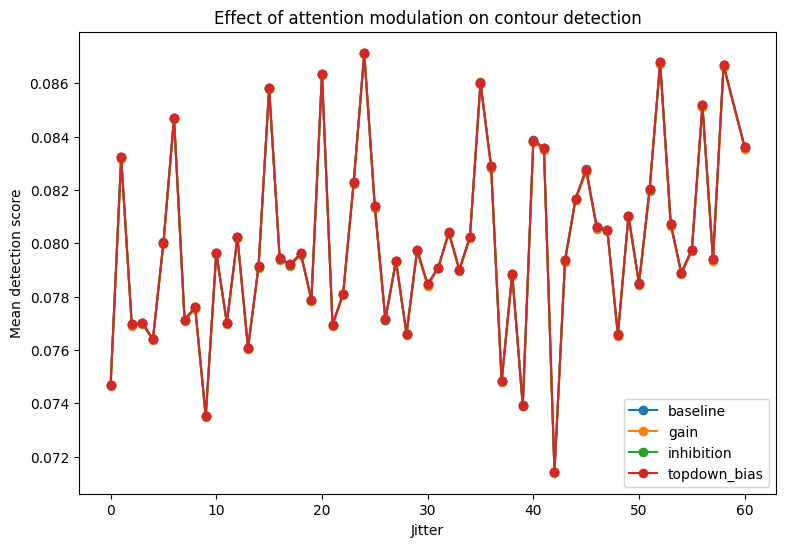

In [22]:
# ============================================================
# 6. PLOT ATTENTION EFFECTEN
# ============================================================

plt.figure(figsize=(9, 6))

for att_type in attention_summary_df["attention_type"].unique():

    sub = attention_summary_df[
        attention_summary_df["attention_type"] == att_type
    ]

    plt.plot(
        sub["jitter"],
        sub["mean_score"],
        marker="o",
        label=att_type,
    )

plt.xlabel("Jitter")
plt.ylabel("Mean detection score")
plt.title("Effect of attention modulation on contour detection")
plt.legend()
plt.show()

In [23]:
# ============================================================
# 7. EFFECTGROOTTE T.O.V. BASELINE
# ============================================================

baseline = attention_summary_df[
    attention_summary_df["attention_type"] == "baseline"
][["jitter", "mean_score"]].rename(
    columns={"mean_score": "baseline_score"}
)

attention_effect_df = attention_summary_df.merge(
    baseline,
    on="jitter",
    how="left"
)

attention_effect_df["delta_vs_baseline"] = (
    attention_effect_df["mean_score"] -
    attention_effect_df["baseline_score"]
)

attention_effect_df

,attention_type,jitter,mean_score,std_score,n,baseline_score,delta_vs_baseline
0,baseline,0,0.074690,NaN,1,0.074690,0.000000e+00
1,baseline,1,0.083223,NaN,1,0.083223,0.000000e+00
2,baseline,2,0.076965,NaN,1,0.076965,0.000000e+00
3,baseline,3,0.077017,NaN,1,0.077017,0.000000e+00
4,baseline,4,0.076406,NaN,1,0.076406,0.000000e+00
...,...,...,...,...,...,...,...
235,topdown_bias,55,0.079757,NaN,1,0.079759,-1.460314e-06
236,topdown_bias,56,0.085182,NaN,1,0.085184,-2.183020e-06
237,topdown_bias,57,0.079406,NaN,1,0.079406,-2.980232e-08
238,topdown_bias,58,0.086680,NaN,1,0.086682,-1.266599e-06


In [24]:
# ============================================================
# 8. TEMPORAL DYNAMICS: BASELINE VS ATTENTION
# ============================================================

def get_temporal_summary_for_image(
    model,
    img_path,
    layer,
    channels,
    attention_type=None,
    target_layer=None,
    target_channels=None,
    gain=1.25,
    inhibition_factor=0.75,
    bias_strength=0.15,
):
    img = load_single_image(img_path).unsqueeze(0).to(device)

    model.reset_hidden_states()

    with torch.no_grad():
        if attention_type is None:
            output = model(img)
        else:
            output = forward_with_attention(
                model=model,
                x=img,
                attention_type=attention_type,
                target_layer=target_layer,
                target_channels=target_channels,
                gain=gain,
                inhibition_factor=inhibition_factor,
                bias_strength=bias_strength,
            )

    temporal = model.temporal_activity[layer]

    rows = []

    for ch in channels:
        for t, state in enumerate(temporal):
            value = state[0, ch].mean().item()

            rows.append({
                "layer": layer,
                "channel": ch,
                "timestep": t,
                "attention_type": "baseline" if attention_type is None else attention_type,
                "activation": value,
            })

    return pd.DataFrame(rows)


# kies een hoge jitter stimulus
example_row = dataset_df[
    (dataset_df["contour_type"] == "C") &
    (dataset_df["contrast"] == "high")
].sort_values("jitter", ascending=False).iloc[0]

temporal_baseline_df = get_temporal_summary_for_image(
    model,
    img_path=example_row["path"],
    layer=C_LAYER,
    channels=C_CHANNELS,
    attention_type=None,
)

temporal_gain_df = get_temporal_summary_for_image(
    model,
    img_path=example_row["path"],
    layer=C_LAYER,
    channels=C_CHANNELS,
    attention_type="gain",
    target_layer=C_LAYER,
    target_channels=C_CHANNELS,
    gain=1.25,
)

temporal_attention_df = pd.concat(
    [temporal_baseline_df, temporal_gain_df],
    ignore_index=True
)

temporal_attention_df.head()

,layer,channel,timestep,attention_type,activation
0,h3_exc,93,0,baseline,0.656213
1,h3_exc,93,1,baseline,0.320429
2,h3_exc,93,2,baseline,0.150825
3,h3_exc,93,3,baseline,0.141147
4,h3_exc,227,0,baseline,0.565923


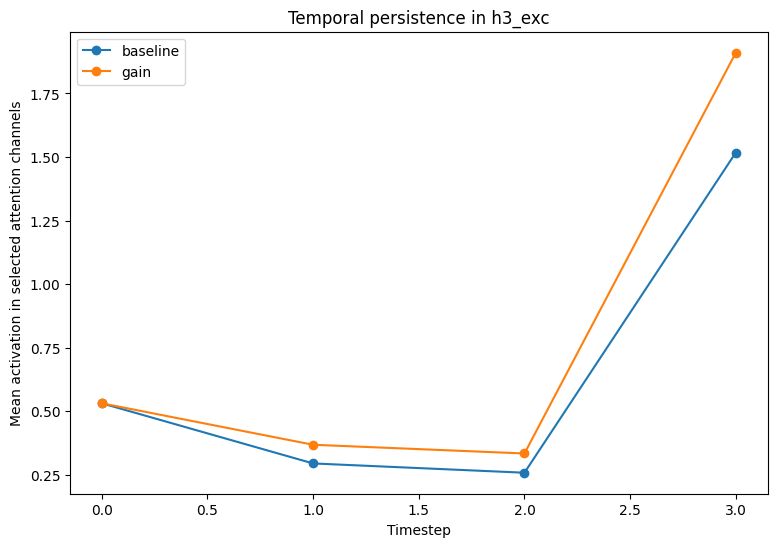

In [25]:
plt.figure(figsize=(9, 6))

for att_type in temporal_attention_df["attention_type"].unique():

    sub = temporal_attention_df[
        temporal_attention_df["attention_type"] == att_type
    ]

    mean_by_t = (
        sub.groupby("timestep")["activation"]
        .mean()
        .reset_index()
    )

    plt.plot(
        mean_by_t["timestep"],
        mean_by_t["activation"],
        marker="o",
        label=att_type,
    )

plt.xlabel("Timestep")
plt.ylabel("Mean activation in selected attention channels")
plt.title(f"Temporal persistence in {C_LAYER}")
plt.legend()
plt.show()

# Geupdate attention

In [26]:
def get_quadrant_crop(tensor, quadrant):
    """
    tensor: [1,1,H,W] of [1,H,W]
    """
    if tensor.ndim == 4:
        tensor = tensor[0, 0]
    elif tensor.ndim == 3:
        tensor = tensor[0]

    H, W = tensor.shape

    if quadrant == "TL":
        return tensor[:H//2, :W//2]
    if quadrant == "TR":
        return tensor[:H//2, W//2:]
    if quadrant == "BL":
        return tensor[H//2:, :W//2]
    if quadrant == "BR":
        return tensor[H//2:, W//2:]

    raise ValueError(quadrant)


def compute_output_scores(output, quadrant):
    """
    Meerdere detectiematen.
    Belangrijkste voor jou waarschijnlijk:
    - quadrant_top5
    - quadrant_max
    """
    prob = torch.sigmoid(output).detach().cpu()

    q = get_quadrant_crop(prob, quadrant)

    flat_q = q.flatten()

    top_k = max(1, int(0.05 * len(flat_q)))

    return {
        "global_mean": prob.mean().item(),
        "quadrant_mean": q.mean().item(),
        "quadrant_max": q.max().item(),
        "quadrant_top5": torch.topk(flat_q, top_k).values.mean().item(),
    }


def run_attention_condition_better(
    model,
    contour_type="C",
    contrast="high",
    attention_type=None,
    target_layer=None,
    target_channels=None,
    gain=1.25,
    inhibition_factor=0.75,
    bias_strength=0.15,
    apply_from_timestep=0,
):
    subset = dataset_df[
        (dataset_df["contour_type"] == contour_type) &
        (dataset_df["contrast"] == contrast)
    ].copy()

    rows = []

    for _, row in tqdm(subset.iterrows(), total=len(subset)):

        img = load_single_image(row["path"]).unsqueeze(0).to(device)

        model.reset_hidden_states()

        with torch.no_grad():

            if attention_type is None:
                output = model(img)

            else:
                output = forward_with_attention(
                    model=model,
                    x=img,
                    attention_type=attention_type,
                    target_layer=target_layer,
                    target_channels=target_channels,
                    gain=gain,
                    inhibition_factor=inhibition_factor,
                    bias_strength=bias_strength,
                    apply_from_timestep=apply_from_timestep,
                )

        scores = compute_output_scores(output, row["quadrant"])

        rows.append({
            "filename": row["filename"],
            "contour_type": row["contour_type"],
            "contrast": row["contrast"],
            "quadrant": row["quadrant"],
            "jitter": row["jitter"],
            "attention_type": "baseline" if attention_type is None else attention_type,
            "target_layer": target_layer,
            "target_channels": str(target_channels),
            "gain": gain,
            "inhibition_factor": inhibition_factor,
            "bias_strength": bias_strength,
            **scores,
        })

    return pd.DataFrame(rows)

In [27]:
# ============================================================
# ATTENTION SWEEP
# ============================================================

attention_runs = []

# baseline
attention_runs.append(
    run_attention_condition_better(
        model,
        contour_type="C",
        contrast="high",
        attention_type=None,
    )
)

# gain sterker testen
for gain in [1.25, 1.5, 2.0]:

    attention_runs.append(
        run_attention_condition_better(
            model,
            contour_type="C",
            contrast="high",
            attention_type="gain",
            target_layer=C_LAYER,
            target_channels=C_CHANNELS,
            gain=gain,
            apply_from_timestep=0,
        )
    )

# top-down/additive bias sterker testen
for bias in [0.15, 0.5, 1.0]:

    attention_runs.append(
        run_attention_condition_better(
            model,
            contour_type="C",
            contrast="high",
            attention_type="topdown_bias",
            target_layer=C_LAYER,
            target_channels=C_CHANNELS,
            bias_strength=bias,
            apply_from_timestep=0,
        )
    )

attention_better_df = pd.concat(attention_runs, ignore_index=True)

attention_better_df.head()

100%|██████████| 60/60 [06:18<00:00,  6.31s/it]


,filename,contour_type,contrast,quadrant,jitter,attention_type,target_layer,target_channels,gain,inhibition_factor,bias_strength,global_mean,quadrant_mean,quadrant_max,quadrant_top5
0,C_high_BL_0_J023_003.png,C,high,BL,23,baseline,None,None,1.25,0.75,0.15,0.082284,0.150562,1.000000,0.980568
1,C_high_BL_0_J014_017.png,C,high,BL,14,baseline,None,None,1.25,0.75,0.15,0.079143,0.133670,0.999982,0.983840
2,C_high_BL_0_J010_022.png,C,high,BL,10,baseline,None,None,1.25,0.75,0.15,0.079644,0.143336,1.000000,0.989704
3,C_high_BL_0_J035_018.png,C,high,BL,35,baseline,None,None,1.25,0.75,0.15,0.086026,0.130935,0.999907,0.980108
4,C_high_BL_0_J021_024.png,C,high,BL,21,baseline,None,None,1.25,0.75,0.15,0.076953,0.152042,0.999988,0.987920


In [28]:
# ============================================================
# SAMENVATTING
# ============================================================

summary_cols = [
    "global_mean",
    "quadrant_mean",
    "quadrant_max",
    "quadrant_top5",
]

attention_better_summary = (
    attention_better_df
    .groupby(["attention_type", "gain", "bias_strength", "jitter"])
    [summary_cols]
    .mean()
    .reset_index()
)

attention_better_summary

,attention_type,gain,bias_strength,jitter,global_mean,quadrant_mean,quadrant_max,quadrant_top5
0,baseline,1.25,0.15,0,0.074690,0.136190,0.999994,0.988945
1,baseline,1.25,0.15,1,0.083223,0.149420,0.999926,0.984254
2,baseline,1.25,0.15,2,0.076965,0.160467,0.999956,0.989017
3,baseline,1.25,0.15,3,0.077017,0.153391,0.999964,0.988788
4,baseline,1.25,0.15,4,0.076406,0.151587,0.999998,0.989397
...,...,...,...,...,...,...,...,...
415,topdown_bias,1.25,1.00,55,0.079565,0.119077,0.999819,0.963751
416,topdown_bias,1.25,1.00,56,0.084620,0.124593,0.999958,0.971725
417,topdown_bias,1.25,1.00,57,0.079107,0.143105,0.999729,0.971055
418,topdown_bias,1.25,1.00,58,0.086129,0.106507,0.999967,0.940205


In [29]:
# ============================================================
# DELTA VS BASELINE
# ============================================================

baseline = attention_better_summary[
    attention_better_summary["attention_type"] == "baseline"
][["jitter", "quadrant_top5"]].rename(
    columns={"quadrant_top5": "baseline_quadrant_top5"}
)

attention_effect_better = attention_better_summary.merge(
    baseline,
    on="jitter",
    how="left"
)

attention_effect_better["delta_quadrant_top5"] = (
    attention_effect_better["quadrant_top5"] -
    attention_effect_better["baseline_quadrant_top5"]
)

attention_effect_better.sort_values(
    "delta_quadrant_top5",
    ascending=False
).head(20)

,attention_type,gain,bias_strength,jitter,global_mean,quadrant_mean,quadrant_max,quadrant_top5,baseline_quadrant_top5,delta_quadrant_top5
413,topdown_bias,1.25,1.00,53,0.079716,0.132394,0.999941,0.948105,0.945318,0.002787
233,gain,2.00,0.15,53,0.079852,0.131348,0.999959,0.948065,0.945318,0.002748
238,gain,2.00,0.15,58,0.086030,0.106584,0.999968,0.940357,0.938117,0.002240
418,topdown_bias,1.25,1.00,58,0.086129,0.106507,0.999967,0.940205,0.938117,0.002088
236,gain,2.00,0.15,56,0.084412,0.124180,0.999960,0.971855,0.970199,0.001656
396,topdown_bias,1.25,1.00,36,0.082349,0.126921,0.999944,0.976764,0.975165,0.001599
406,topdown_bias,1.25,1.00,46,0.079689,0.142638,0.999924,0.966975,0.965404,0.001571
216,gain,2.00,0.15,36,0.082218,0.126322,0.999946,0.976725,0.975165,0.001559
416,topdown_bias,1.25,1.00,56,0.084620,0.124593,0.999958,0.971725,0.970199,0.001527
353,topdown_bias,1.25,0.50,53,0.080156,0.131301,0.999943,0.946822,0.945318,0.001504


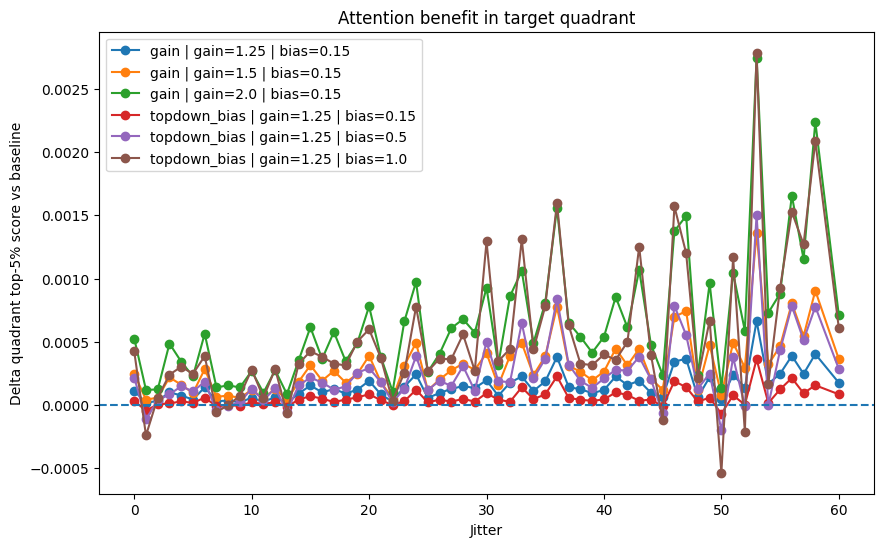

In [30]:
plt.figure(figsize=(10,6))

for name, sub in attention_effect_better.groupby(
    ["attention_type", "gain", "bias_strength"]
):

    att_type, gain, bias = name

    if att_type == "baseline":
        continue

    label = f"{att_type} | gain={gain} | bias={bias}"

    plt.plot(
        sub["jitter"],
        sub["delta_quadrant_top5"],
        marker="o",
        label=label
    )

plt.axhline(0, linestyle="--")
plt.xlabel("Jitter")
plt.ylabel("Delta quadrant top-5% score vs baseline")
plt.title("Attention benefit in target quadrant")
plt.legend()
plt.show()

In [31]:
attention_effect_better.sort_values(
    "delta_quadrant_top5",
    ascending=False
).head(20)

,attention_type,gain,bias_strength,jitter,global_mean,quadrant_mean,quadrant_max,quadrant_top5,baseline_quadrant_top5,delta_quadrant_top5
413,topdown_bias,1.25,1.00,53,0.079716,0.132394,0.999941,0.948105,0.945318,0.002787
233,gain,2.00,0.15,53,0.079852,0.131348,0.999959,0.948065,0.945318,0.002748
238,gain,2.00,0.15,58,0.086030,0.106584,0.999968,0.940357,0.938117,0.002240
418,topdown_bias,1.25,1.00,58,0.086129,0.106507,0.999967,0.940205,0.938117,0.002088
236,gain,2.00,0.15,56,0.084412,0.124180,0.999960,0.971855,0.970199,0.001656
396,topdown_bias,1.25,1.00,36,0.082349,0.126921,0.999944,0.976764,0.975165,0.001599
406,topdown_bias,1.25,1.00,46,0.079689,0.142638,0.999924,0.966975,0.965404,0.001571
216,gain,2.00,0.15,36,0.082218,0.126322,0.999946,0.976725,0.975165,0.001559
416,topdown_bias,1.25,1.00,56,0.084620,0.124593,0.999958,0.971725,0.970199,0.001527
353,topdown_bias,1.25,0.50,53,0.080156,0.131301,0.999943,0.946822,0.945318,0.001504


In [32]:
attention_effect_better.groupby(
    ["attention_type", "gain", "bias_strength"]
)["delta_quadrant_top5"].mean().sort_values(ascending=False)

attention_type  gain  bias_strength
gain            2.00  0.15             0.000651
topdown_bias    1.25  1.00             0.000530
gain            1.50  0.15             0.000311
topdown_bias    1.25  0.50             0.000247
gain            1.25  0.15             0.000148
topdown_bias    1.25  0.15             0.000056
baseline        1.25  0.15             0.000000
Name: delta_quadrant_top5, dtype: float64

In [33]:
attention_effect_better[
    attention_effect_better["jitter"] >= 40
].groupby(
    ["attention_type", "gain", "bias_strength"]
)["delta_quadrant_top5"].mean().sort_values(ascending=False)

attention_type  gain  bias_strength
gain            2.00  0.15             0.000987
topdown_bias    1.25  1.00             0.000811
gain            1.50  0.15             0.000472
topdown_bias    1.25  0.50             0.000372
gain            1.25  0.15             0.000227
topdown_bias    1.25  0.15             0.000087
baseline        1.25  0.15             0.000000
Name: delta_quadrant_top5, dtype: float64

# VISUALIZE BASELINE VS ATTENTION MODULATION

C_high_BL_0_J000_008.png
Saved figure to: attention_visualizations/h3_exc_channel_93_jitter_0_C_high_BL_0_J000_008.png


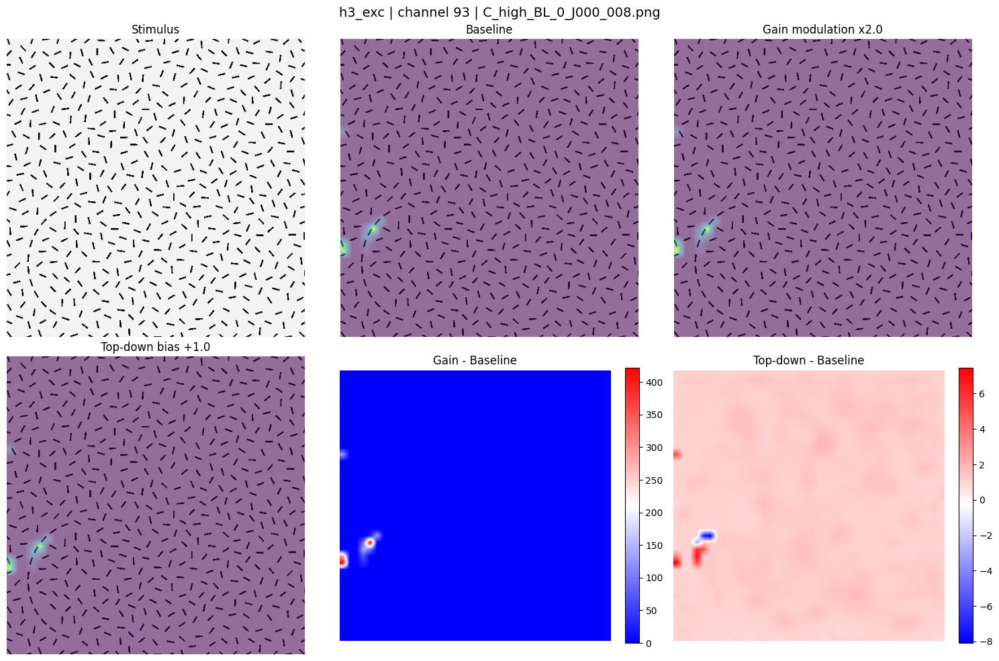

Saved figure to: attention_visualizations/h3_exc_channel_227_jitter_0_C_high_BL_0_J000_008.png


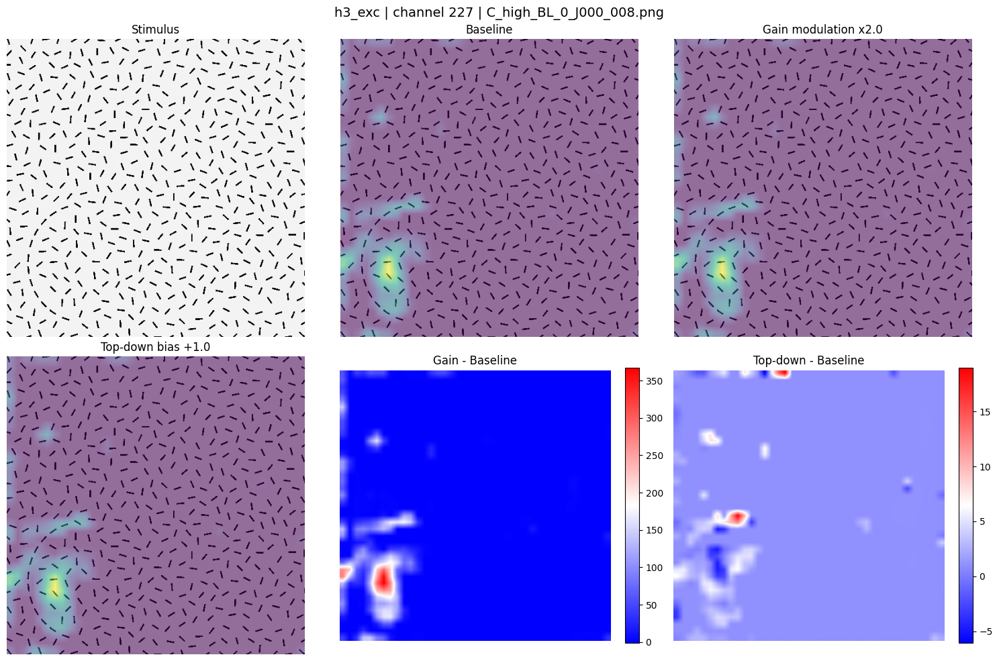

Saved figure to: attention_visualizations/h3_exc_channel_34_jitter_0_C_high_BL_0_J000_008.png


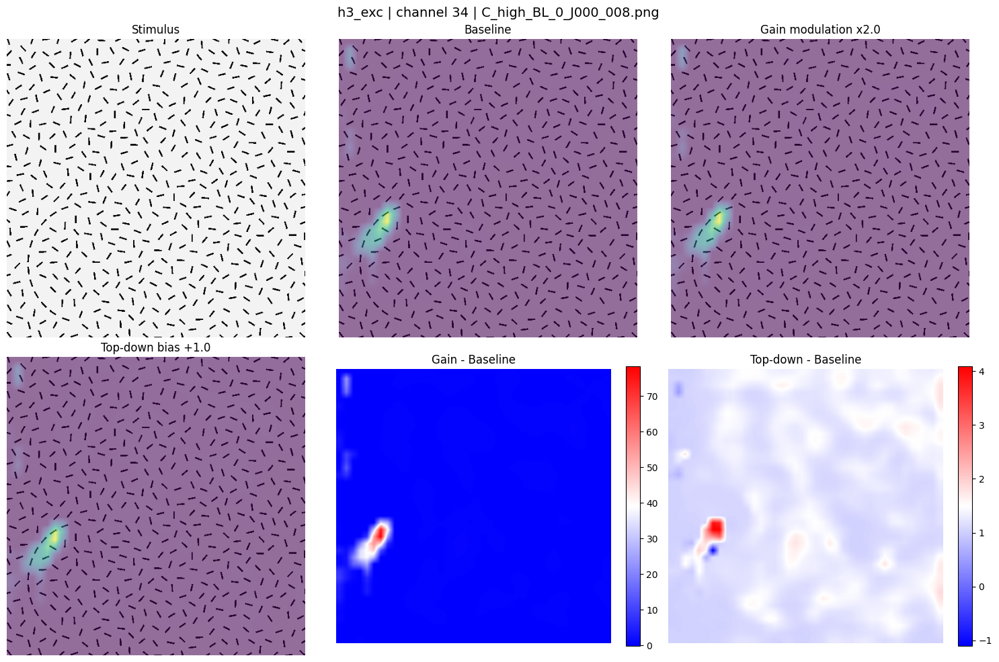

Saved figure to: attention_visualizations/h3_exc_channel_49_jitter_0_C_high_BL_0_J000_008.png


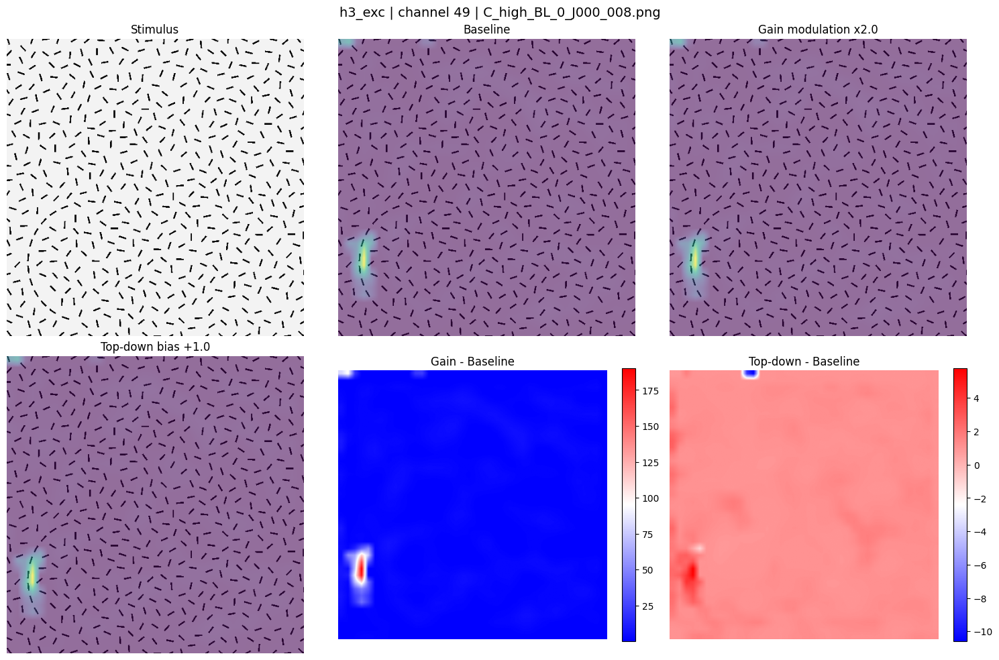

In [42]:
plt.ioff()

# ============================================================
# VISUALIZE BASELINE VS REAL ATTENTION MODULATION
# ============================================================

import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
from PIL import Image
import numpy as np

# ------------------------------------------------------------
# SETTINGS
# ------------------------------------------------------------

LAYER = "h3_exc"
CHANNELS = [93, 227, 34, 49]

GAIN_VALUE = 2.0
BIAS_VALUE = 1.0

TARGET_JITTER = 0
CONTOUR_TYPE = "C"
CONTRAST = "high"

# ------------------------------------------------------------
# GET ONE TEST IMAGE
# ------------------------------------------------------------

test_subset = dataset_df[
    (dataset_df["contour_type"] == CONTOUR_TYPE) &
    (dataset_df["contrast"] == CONTRAST) &
    (dataset_df["jitter"] == TARGET_JITTER)
]

if len(test_subset) == 0:
    raise ValueError("Geen afbeelding gevonden voor deze selectie.")

test_row = test_subset.iloc[0]

print(test_row["filename"])

pil_img = Image.open(test_row["path"]).convert("RGB")
img_tensor = transform(pil_img).unsqueeze(0).to(device)

# ------------------------------------------------------------
# HELPERS
# ------------------------------------------------------------

def get_layer_map_after_forward(
    model,
    img_tensor,
    layer_name,
    channel,
    attention_type=None,
    target_layer=None,
    target_channels=None,
    gain=1.0,
    bias_strength=0.0,
):
    model.reset_hidden_states()

    with torch.no_grad():

        if attention_type is None:
            _ = model(img_tensor)

        else:
            _ = forward_with_attention(
                model=model,
                x=img_tensor,
                attention_type=attention_type,
                target_layer=target_layer,
                target_channels=target_channels,
                gain=gain,
                bias_strength=bias_strength,
                apply_from_timestep=0,
            )

    tensor = getattr(model, layer_name)

    fmap = tensor.detach().cpu()[0, channel]

    # resize naar stimulusformaat
    fmap_resized = F.interpolate(
        fmap[None, None, :, :],
        size=pil_img.size[::-1],
        mode="bilinear",
        align_corners=False,
    )[0, 0].numpy()

    return fmap_resized


def normalize_map(x):
    x = x - x.min()
    return x / (x.max() + 1e-8)


# ------------------------------------------------------------
# PLOTTING
# ------------------------------------------------------------

for channel in CHANNELS:

    baseline_map = get_layer_map_after_forward(
        model,
        img_tensor,
        layer_name=LAYER,
        channel=channel,
        attention_type=None,
    )

    gain_map = get_layer_map_after_forward(
        model,
        img_tensor,
        layer_name=LAYER,
        channel=channel,
        attention_type="gain",
        target_layer=LAYER,
        target_channels=CHANNELS,
        gain=GAIN_VALUE,
    )

    topdown_map = get_layer_map_after_forward(
        model,
        img_tensor,
        layer_name=LAYER,
        channel=channel,
        attention_type="topdown_bias",
        target_layer=LAYER,
        target_channels=CHANNELS,
        bias_strength=BIAS_VALUE,
    )

    gain_diff = gain_map - baseline_map
    topdown_diff = topdown_map - baseline_map

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    axes[0, 0].imshow(pil_img)
    axes[0, 0].set_title("Stimulus")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(pil_img)
    axes[0, 1].imshow(normalize_map(baseline_map), alpha=0.55)
    axes[0, 1].set_title("Baseline")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(pil_img)
    axes[0, 2].imshow(normalize_map(gain_map), alpha=0.55)
    axes[0, 2].set_title(f"Gain modulation x{GAIN_VALUE}")
    axes[0, 2].axis("off")

    axes[1, 0].imshow(pil_img)
    axes[1, 0].imshow(normalize_map(topdown_map), alpha=0.55)
    axes[1, 0].set_title(f"Top-down bias +{BIAS_VALUE}")
    axes[1, 0].axis("off")

    im1 = axes[1, 1].imshow(gain_diff, cmap="bwr")
    axes[1, 1].set_title("Gain - Baseline")
    axes[1, 1].axis("off")
    plt.colorbar(im1, ax=axes[1, 1], fraction=0.046)

    im2 = axes[1, 2].imshow(topdown_diff, cmap="bwr")
    axes[1, 2].set_title("Top-down - Baseline")
    axes[1, 2].axis("off")
    plt.colorbar(im2, ax=axes[1, 2], fraction=0.046)

    plt.suptitle(
        f"{LAYER} | channel {channel} | {test_row['filename']}",
        fontsize=14
    )

    plt.tight_layout()

    import os

    outdir = "attention_visualizations"
    os.makedirs(outdir, exist_ok=True)

    save_path = os.path.join(
        outdir,
        f"{LAYER}_channel_{channel}_jitter_{TARGET_JITTER}_{test_row['filename'].replace('.png','')}.png"
    )

    fig.savefig(
        save_path,
        dpi=200,
        bbox_inches="tight"
    )

    print(f"Saved figure to: {save_path}")

    display(fig)
    plt.close(fig)